Chpater 1 : preprocessing signle - subject data

#Step 1 Loading Data

In [196]:
!pip install mne

In [197]:
import numpy as np
import mne
import os
import gdown
import zipfile
from mne.preprocessing import ICA
from mne.time_frequency import tfr_morlet
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='matplotlib')
plt.rcParams["figure.dpi"] = 150
%matplotlib inline

In [198]:
#Download the sample_data

data_dir ="data/"
if not os.path.exists(data_dir):
  os.makedirs(data_dir)

url = "https://drive.google.com/file/d/1bXD-_dDnH5Mv3DQrV7V9fYM4-xYsZ0DN/view?usp=sharing"
filename = "sample_data"
filepath = data_dir + filename + ".zip"

In [199]:
# Download the data
gdown.download(url=url, output=filepath, quiet=False, fuzzy=True)
print("Download completes!")
# unzip the data
with zipfile.ZipFile(filepath, 'r') as zip:
    zip.extractall(data_dir)
print("Unzip completes!")

data_path = data_dir + 'sample_data/eeglab_data.set'

Downloading...
From: https://drive.google.com/uc?id=1bXD-_dDnH5Mv3DQrV7V9fYM4-xYsZ0DN
To: /content/data/sample_data.zip
100%|██████████| 7.30M/7.30M [00:00<00:00, 127MB/s]


Download completes!
Unzip completes!


In [200]:
raw = mne.io.read_raw_eeglab(data_path, preload = True)

Reading /content/data/sample_data/eeglab_data.fdt
Reading 0 ... 30503  =      0.000 ...   238.305 secs...


##checking Raw Data Format

In [201]:
print(raw)
raw.info

<RawEEGLAB | eeglab_data.fdt, 32 x 30504 (238.3 s), ~7.5 MiB, data loaded>


<Info | 7 non-empty values
 bads: []
 ch_names: EEG 000, EEG 001, EEG 002, EEG 003, EEG 004, EEG 005, EEG 006, ...
 chs: 32 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 32
 projs: []
 sfreq: 128.0 Hz
>

we set preload=True when we load the data, so the data is preloaded into memory.

##localizing Channels

- here channel names are not in standard names.
- In this case, the dataset is associated with a .locs file which includes electrode location information. Thus, we need to pass this information into our EEG data.

In [202]:
#.loc filepath
locs_info_path = data_dir + "sample_data/eeglab_chan32.locs"
#import channel locations information
montage = mne.channels.read_custom_montage(locs_info_path)
#import correct channels names
new_chan_names = np.loadtxt(locs_info_path, dtype=str, usecols=3)
#get old channel names
old_chan_names = raw.info['ch_names']
#create a dictornary to match old channels names and new (correct) channel names
chan_names_dict = {old_chan_names[i]:new_chan_names[i] for i in range(32)}
#update the channel naems in the dataset
raw.rename_channels(chan_names_dict)
# check localization information
raw.set_montage(montage)

<RawEEGLAB | eeglab_data.fdt, 32 x 30504 (238.3 s), ~7.5 MiB, data loaded>

If the EEG data (hat & recording system) you are working with belongs to a specific systems, you might be able to directly use mne.channels.make_standard_montage function to generate channel location information.
Take the standard international 10-20 system as an example, the corresponding code could be changed as follows:

montage = mne.channels.make_standard_montage("standard_1020")


In [203]:
#The default type of channels in MNE is 'eeg'
#Here, we need to set the channesl tyoe if two EOG channels as 'eog'

chan_types_dict = {"EOG1":"eog", "EOG2":"eog"}
raw.set_channel_types(chan_types_dict)

<RawEEGLAB | eeglab_data.fdt, 32 x 30504 (238.3 s), ~7.5 MiB, data loaded>

In [204]:
print(raw.info)

<Info | 8 non-empty values
 bads: []
 ch_names: FPz, EOG1, F3, Fz, F4, EOG2, FC5, FC1, FC2, FC6, T7, C3, C4, Cz, ...
 chs: 30 EEG, 2 EOG
 custom_ref_applied: False
 dig: 35 items (3 Cardinal, 32 EEG)
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 32
 projs: []
 sfreq: 128.0 Hz
>


##Visualizing Raw Data

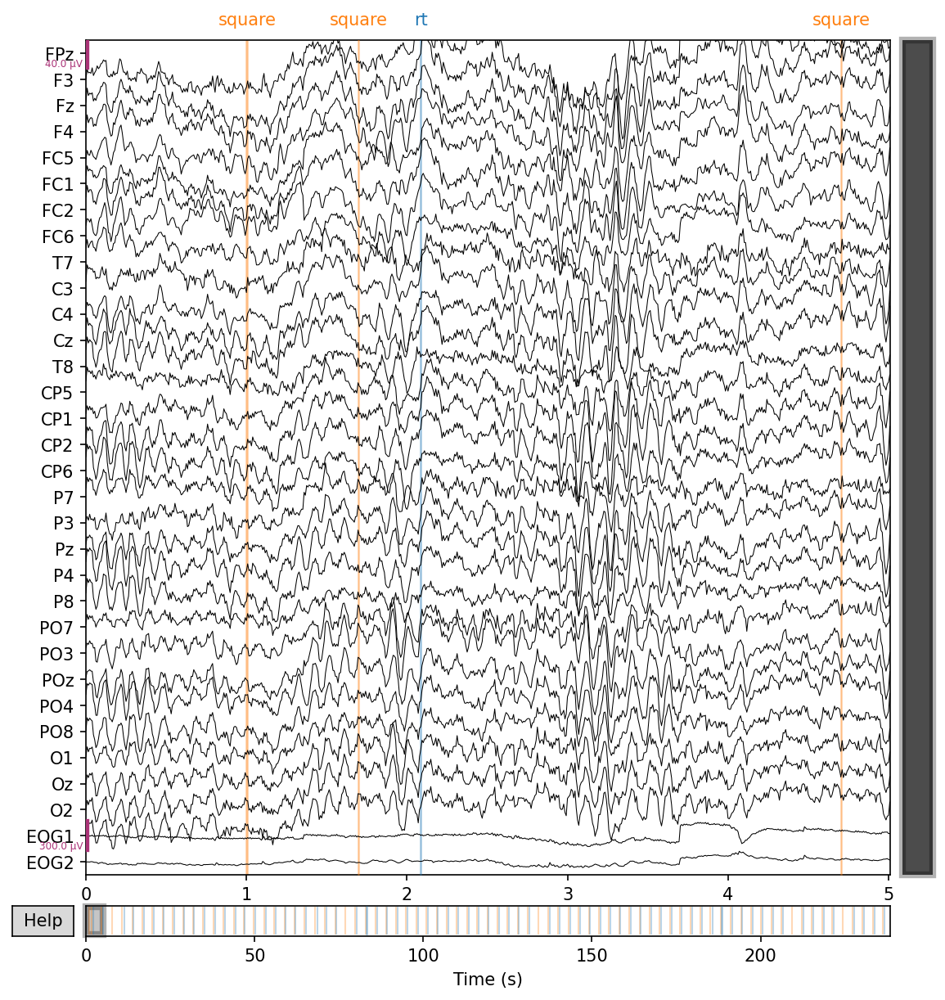

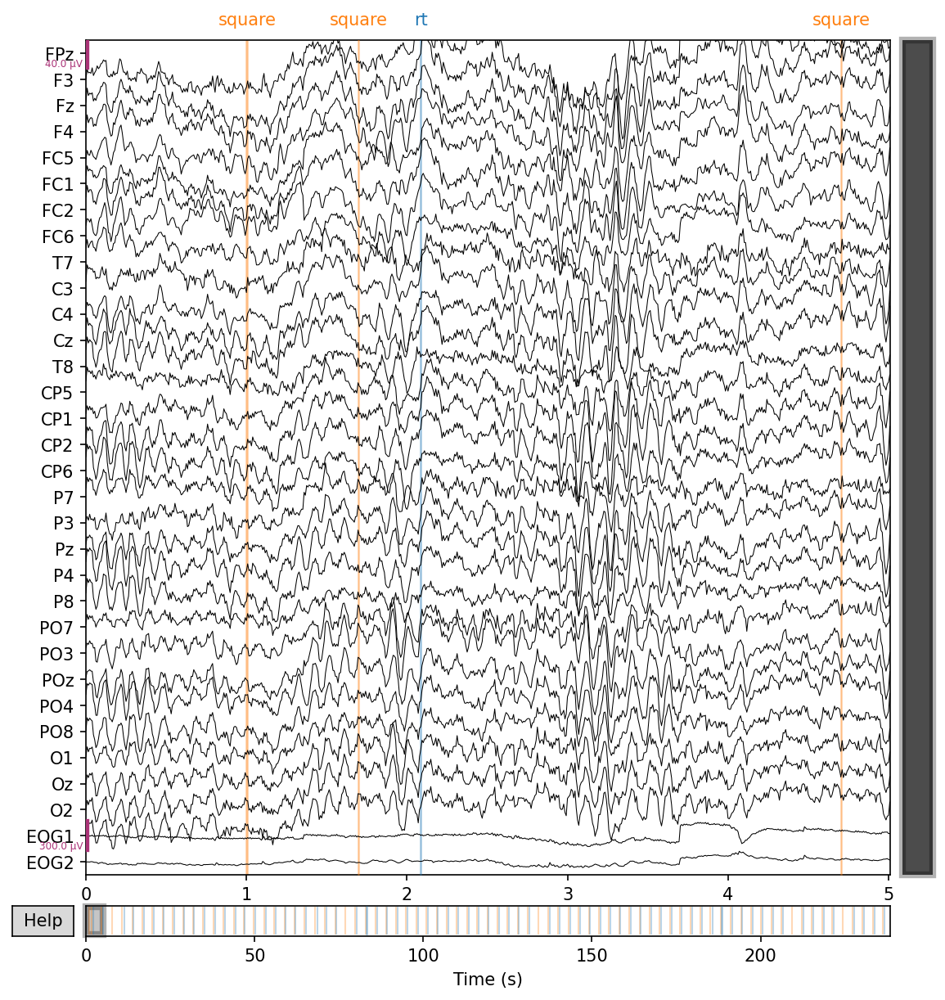

In [205]:
raw.plot(duration=5, n_channels=32, clipping=None)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


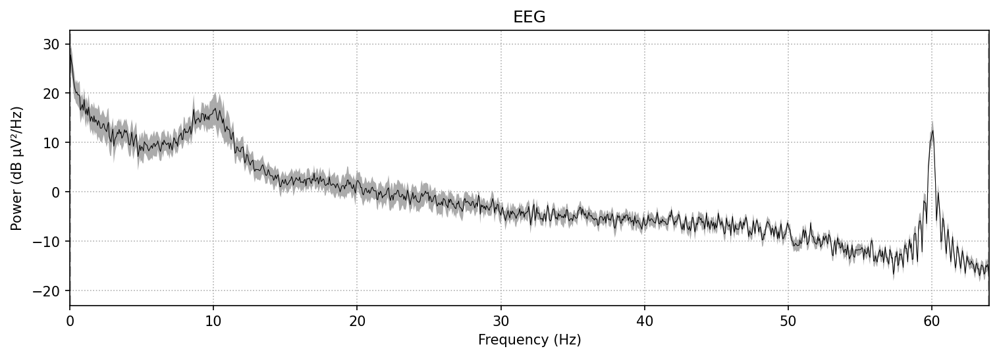

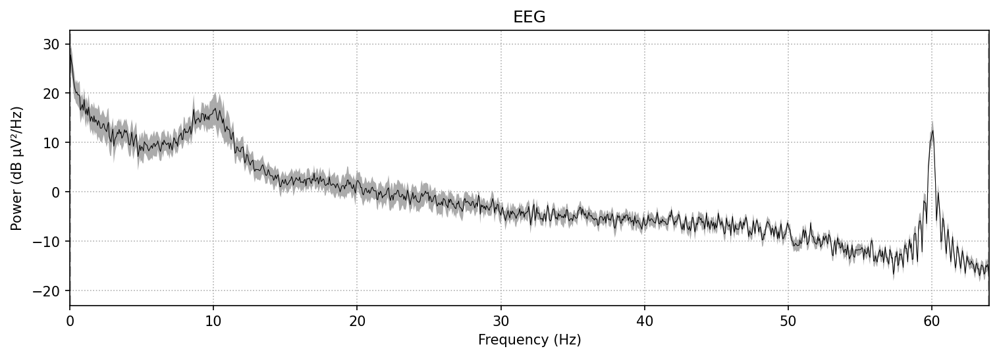

In [206]:
##Plot power spectral density across channels
raw.plot_psd(average=True)

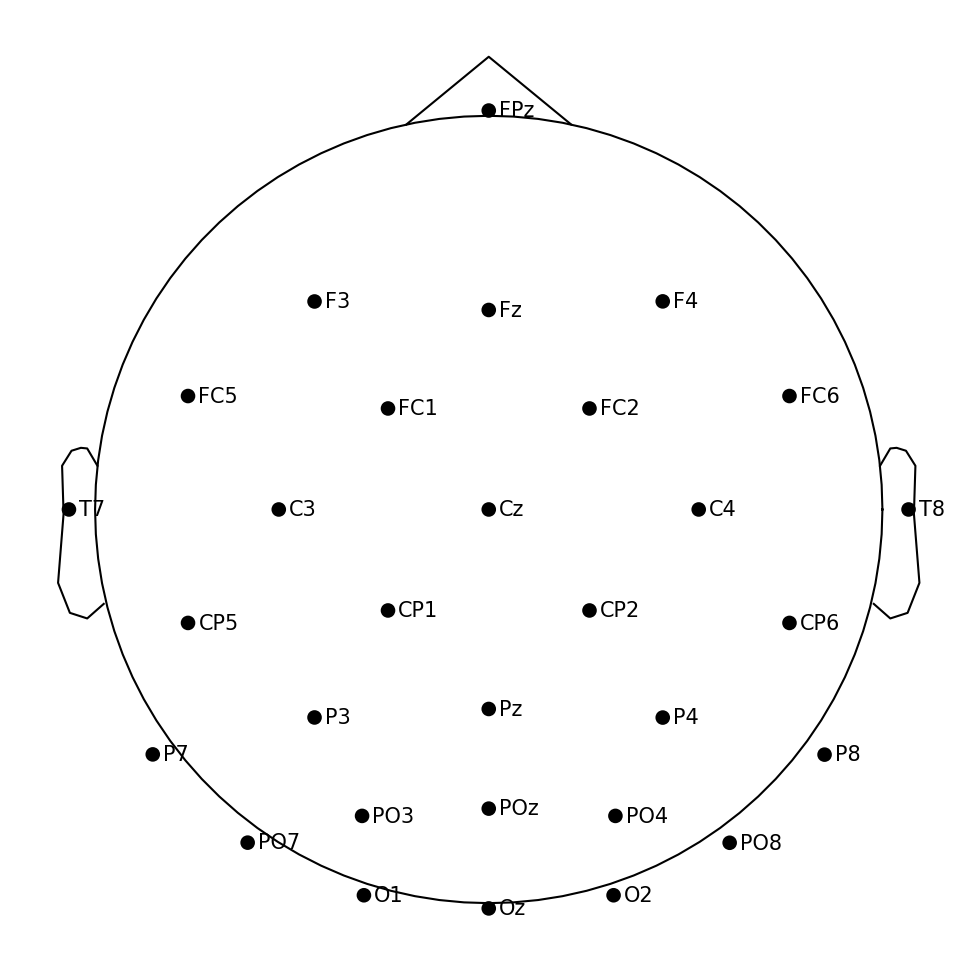

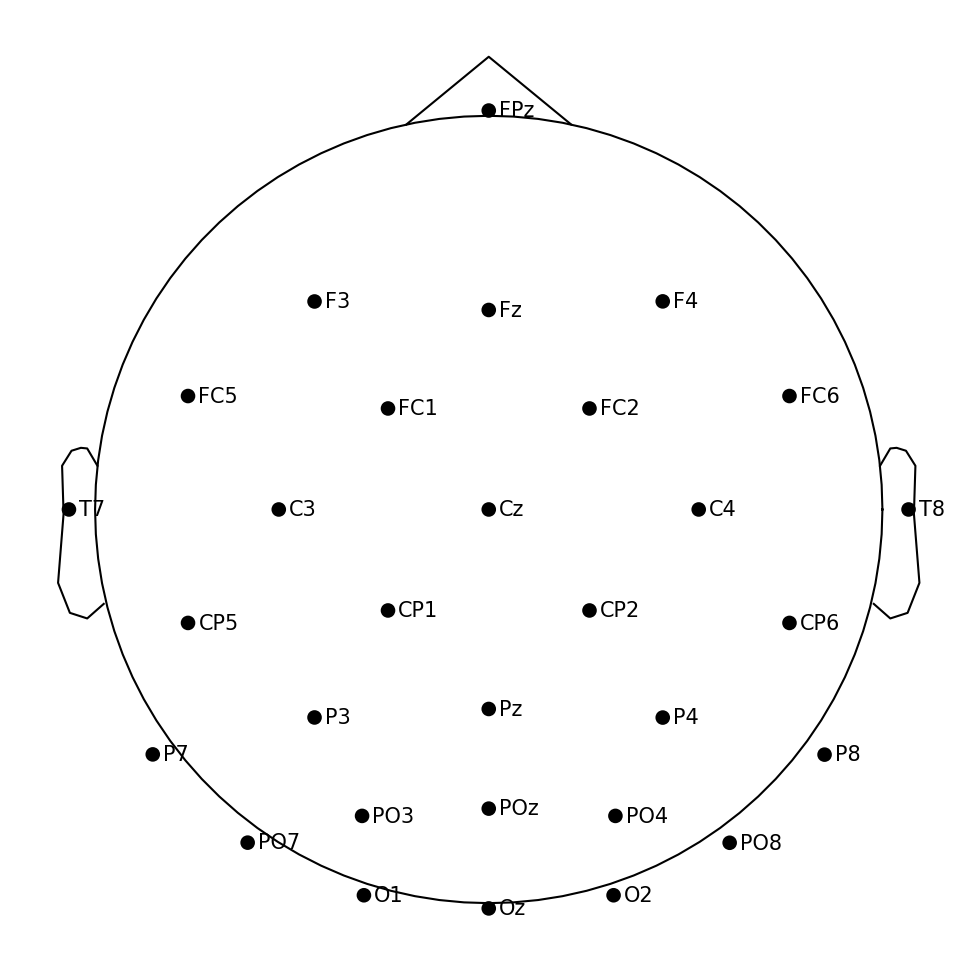

In [207]:
#plot the channels loactions map
raw.plot_sensors(ch_type='eeg', show_names=True)

### plot channel-wise frequency spectra as topography

Effective window size : 16.000 (s)


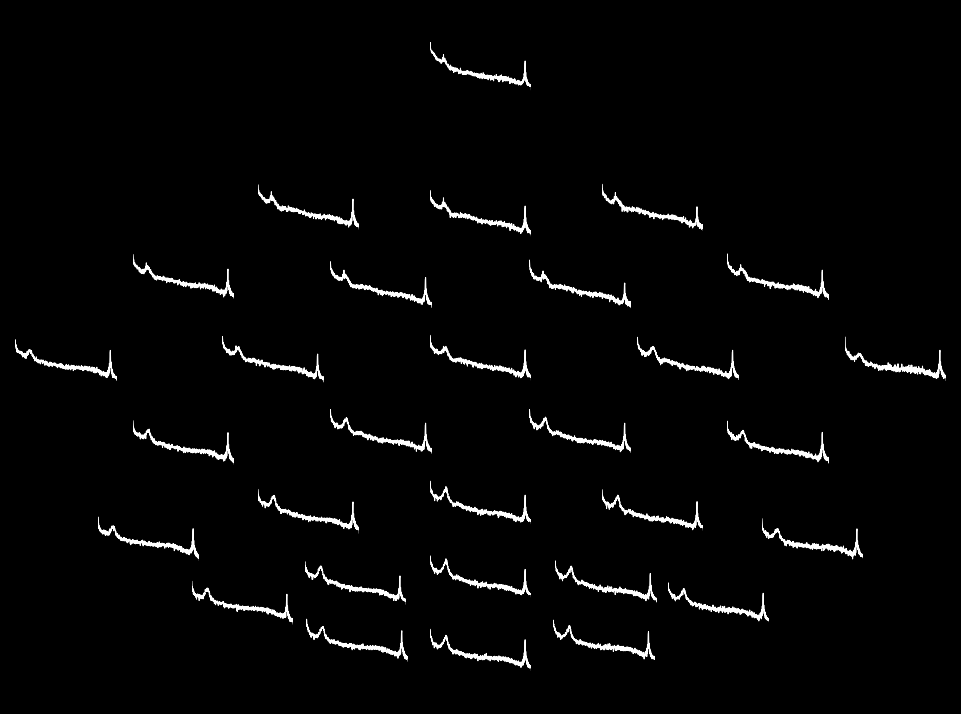

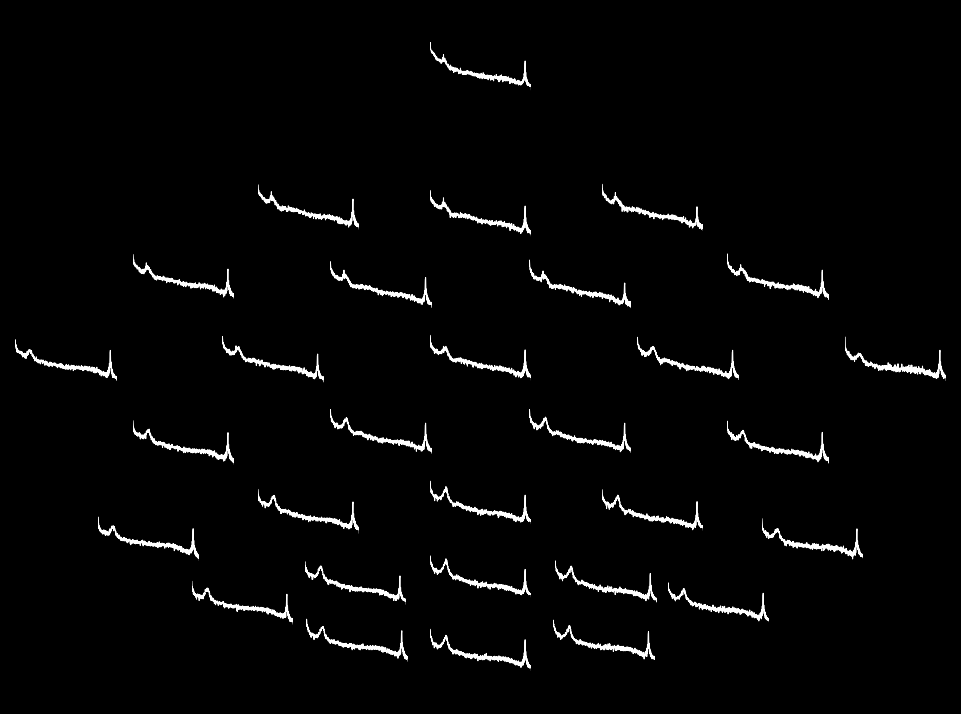

In [208]:
raw.compute_psd().plot_topo()

#sptep 2 Filtering Data

###Notch filtering

Through the power spectrum in Step 1, we can see that there might be ambient noise at around 60Hz.
Here first use the trap filter to remove utility frequency. Different countries and areas may have different utility frequencies. Remember to judge it by the power spectrum.

In [209]:
raw = raw.notch_filter(freqs=(60))

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge: 60.65 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 60.90 Hz)
- Filter length: 845 samples (6.602 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


plot the power spectrum

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


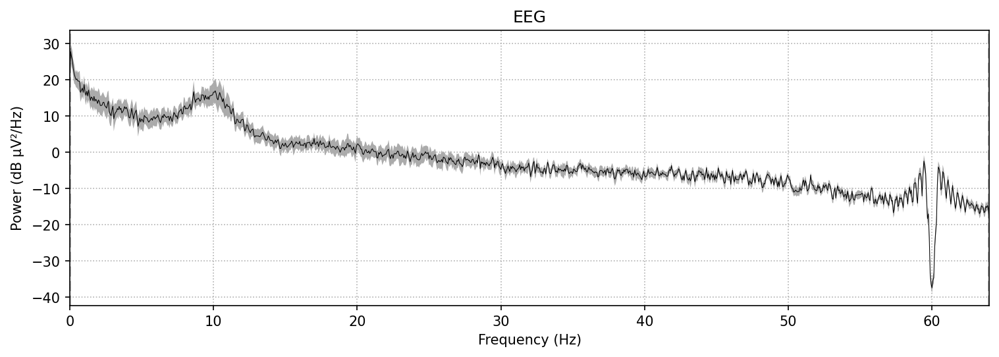

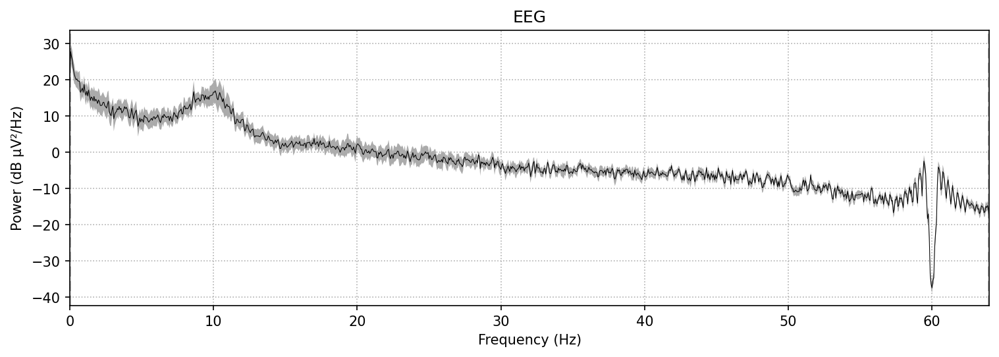

In [210]:
raw.plot_psd(average=True)

##High/Low-Pass Filtering

In pre-processing, the high-pass filtering is usually a necessary step.
The most common filtering operation is to use a low-pass filter at 30 Hz and a high-pass filter at 0.1 Hz.
High-pass filtering is used to eliminate voltage drift, and low-pass filtering is used to eliminate high frequency noises.

In [211]:
raw = raw.filter(l_freq = 0.1, h_freq = 30)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 4225 samples (33.008 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


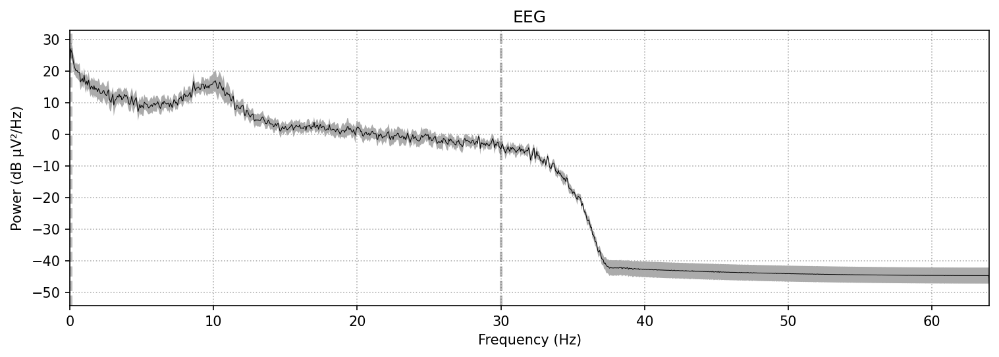

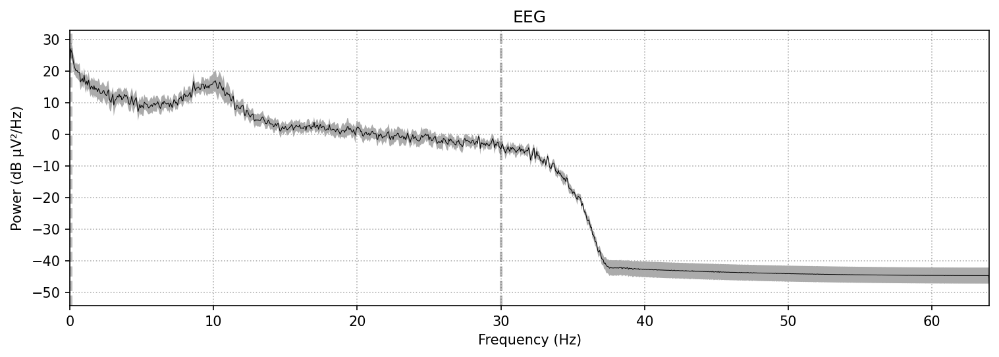

In [212]:
raw.plot_psd(average=True)

#Step 3 Rejecting Artifacts

##Remove bad signals

The bad channels in MNE will not be deleted directly. MNE just marks the bad channels with 'bads' labels. In the example below, we assume that channel 'FC5' is bad. Thus, we can mark 'FC5' as 'bads':

In [213]:
raw.ch_names

['FPz',
 'EOG1',
 'F3',
 'Fz',
 'F4',
 'EOG2',
 'FC5',
 'FC1',
 'FC2',
 'FC6',
 'T7',
 'C3',
 'C4',
 'Cz',
 'T8',
 'CP5',
 'CP1',
 'CP2',
 'CP6',
 'P7',
 'P3',
 'Pz',
 'P4',
 'P8',
 'PO7',
 'PO3',
 'POz',
 'PO4',
 'PO8',
 'O1',
 'Oz',
 'O2']

In [214]:
# Marking the bad channel
raw.info['bads'].append('FC5')
# Printing the bad channel's name
print(raw.info['bads'])

['FC5']


###Reconstruct Bac Channels

In [215]:
raw = raw.interpolate_bads()

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.0 mm
Computing interpolation matrix from 29 sensor positions
Interpolating 1 sensors


The 'bads' marker will be removed by default after signal reconstruction.  
If you do not want to remove the markings of the original bad channels, set the reset_bads parameter as False.  
The corresponding code is as follow:

> raw = raw.interpolate_bads(reset_bads=False)

## Run ICA

The programming idea of ICA in MNE is to first build an ICA object (which can be understood as building an ICA analyzer) then use this ICA analyzer to analyze the EEG data (through methods of ICA object).
Since ICA is not effective for low frequency data, here ICA and artifact components removal are based on high-pass 1Hz data and then applied to high-pass 0.1Hz data.

In [216]:
ica = ICA(max_iter='auto')
raw_for_ica = raw.copy().filter(l_freq=1, h_freq=None)
ica.fit(raw_for_ica)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 423 samples (3.305 s)

Fitting ICA to data using 30 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by non-zero PCA components: 29 components
Fitting ICA took 9.1s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,55 iterations on raw data (30504 samples)
ICA components,29
Available PCA components,30
Channel types,eeg
ICA components marked for exclusion,—


Creating RawArray with float64 data, n_channels=31, n_times=30504
    Range : 0 ... 30503 =      0.000 ...   238.305 secs
Ready.


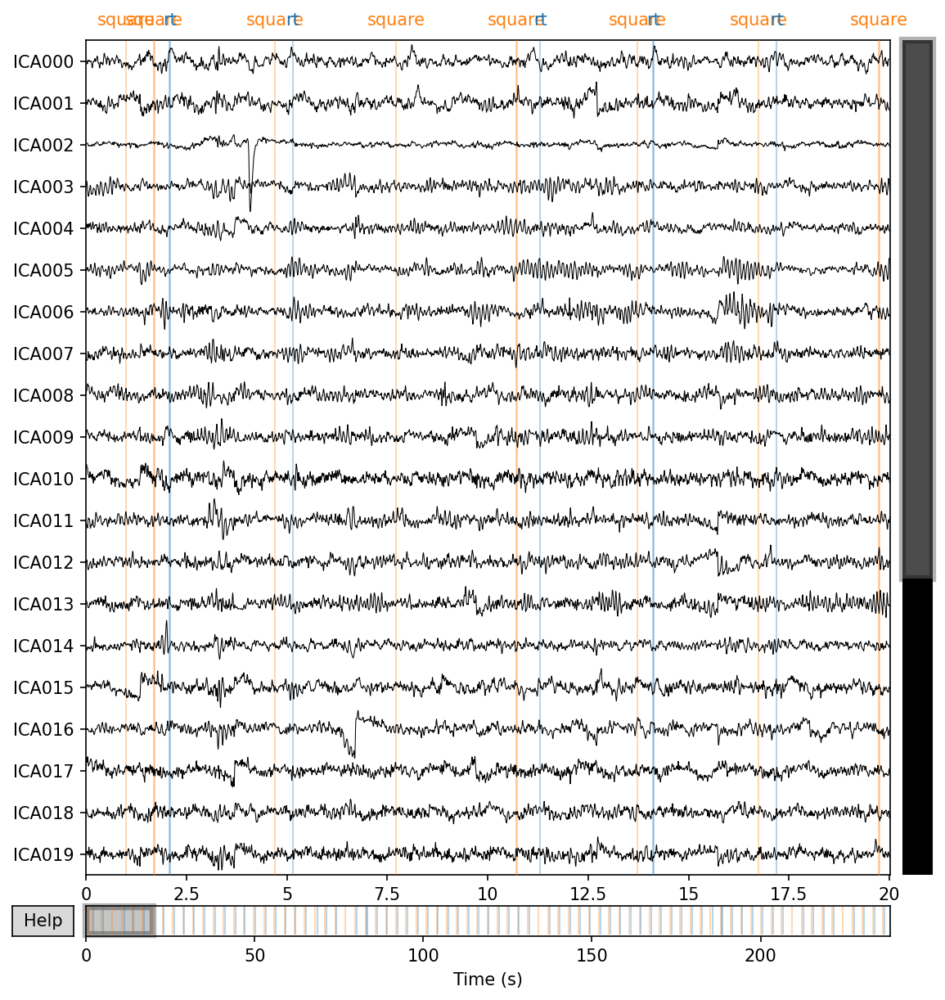

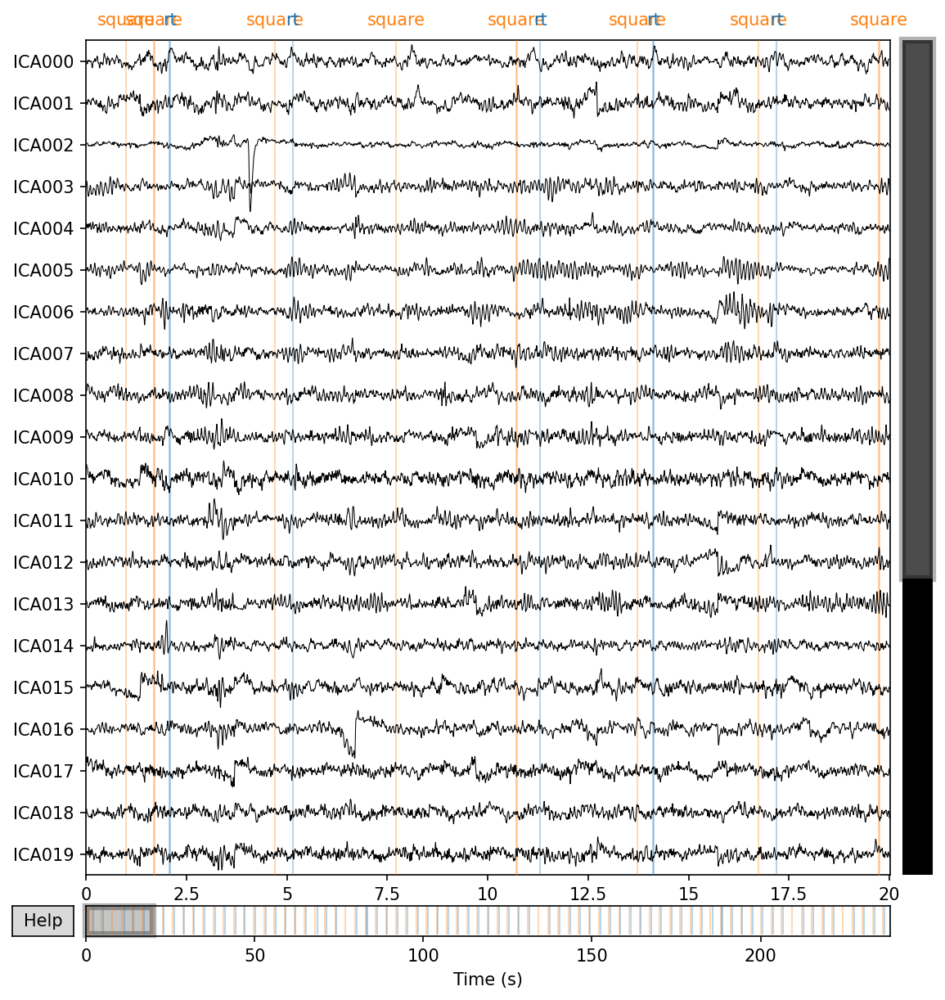

In [217]:
ica.plot_sources(raw_for_ica)

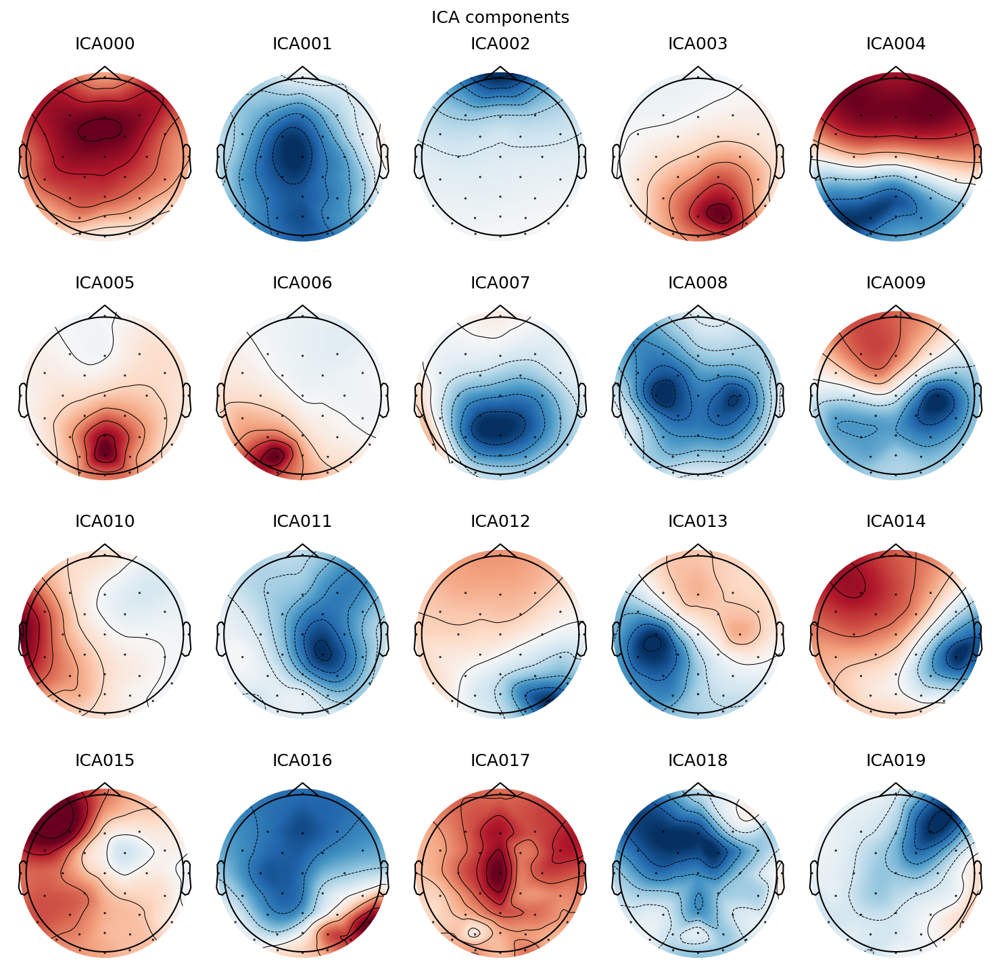

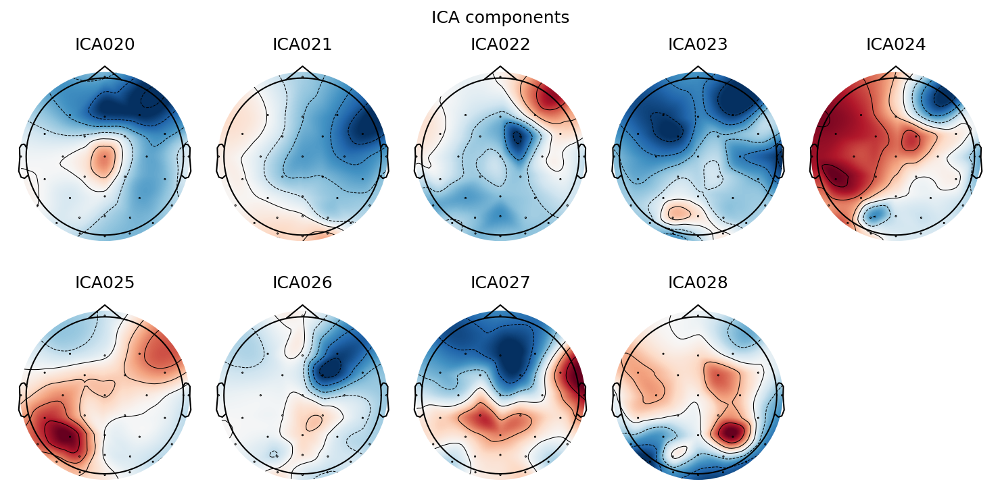

[<MNEFigure size 1462.5x1450.5 with 20 Axes>,
 <MNEFigure size 1462.5x744 with 9 Axes>]

In [218]:
ica.plot_components()

#### Check the signal difference before and after the removal of a component / several component.

Applying ICA to Raw instance
    Transforming to ICA space (29 components)
    Zeroing out 1 ICA component
    Projecting back using 30 PCA components


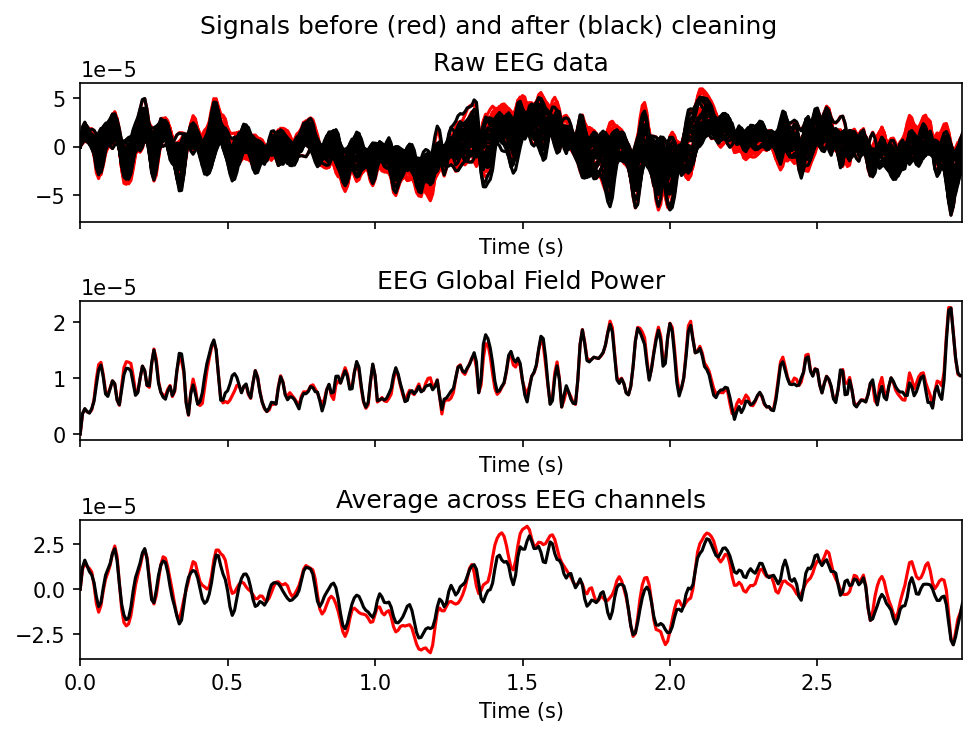

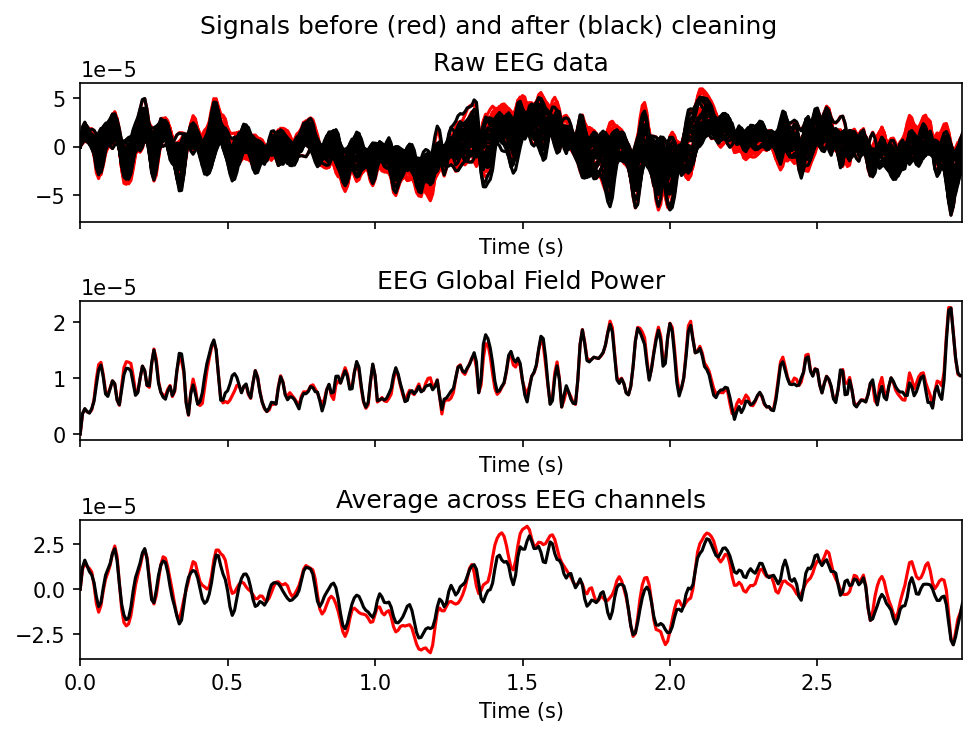

In [219]:
ica.plot_overlay(raw_for_ica, exclude=[1])

###Visualize each component

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
119 matching events found
No baseline correction applied
0 projection items activated


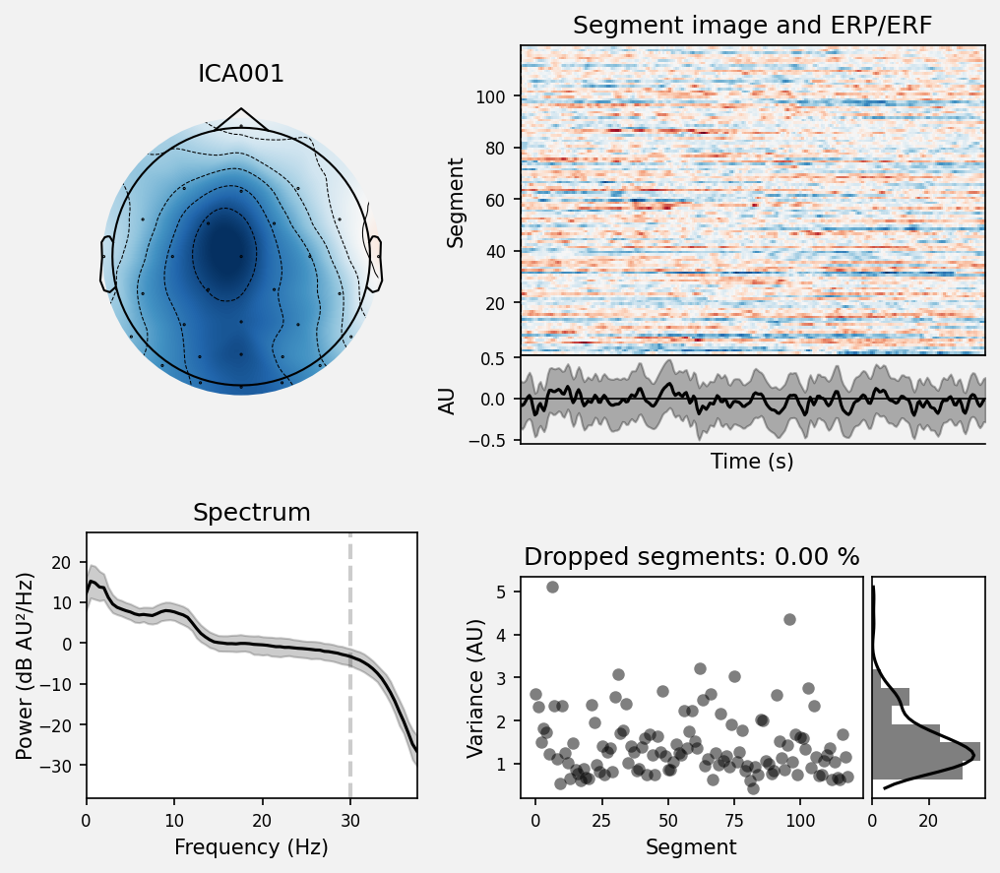

[<Figure size 1050x900 with 6 Axes>]

In [220]:
ica.plot_properties(raw, picks=[1])

The power of component ICA001 is higher in the frontal area and is higher at low frequencies, with significant enhancement in some trials.
It can be judged as an EOG component.



In [221]:
# set the component index(es) to exclude
ica.exclude = [1]
# apply to EEG data
ica.apply(raw)

Applying ICA to Raw instance
    Transforming to ICA space (29 components)
    Zeroing out 1 ICA component
    Projecting back using 30 PCA components


<RawEEGLAB | eeglab_data.fdt, 32 x 30504 (238.3 s), ~7.5 MiB, data loaded>

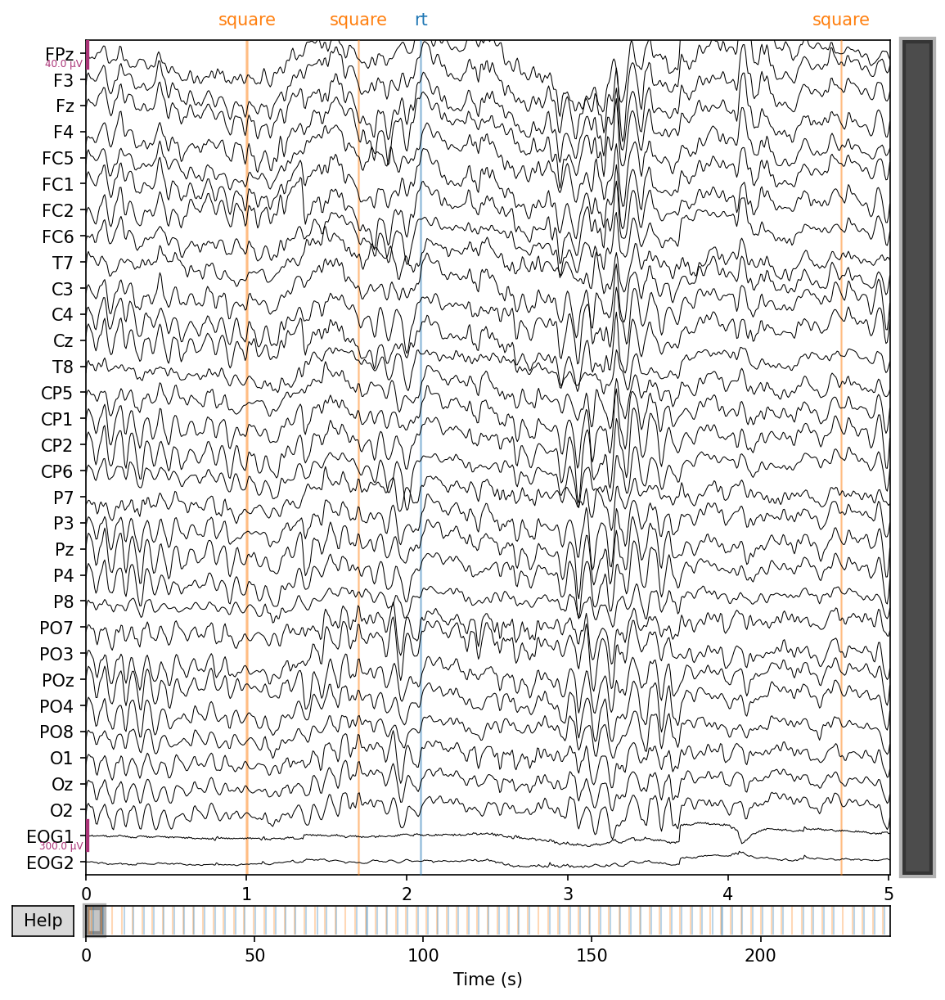

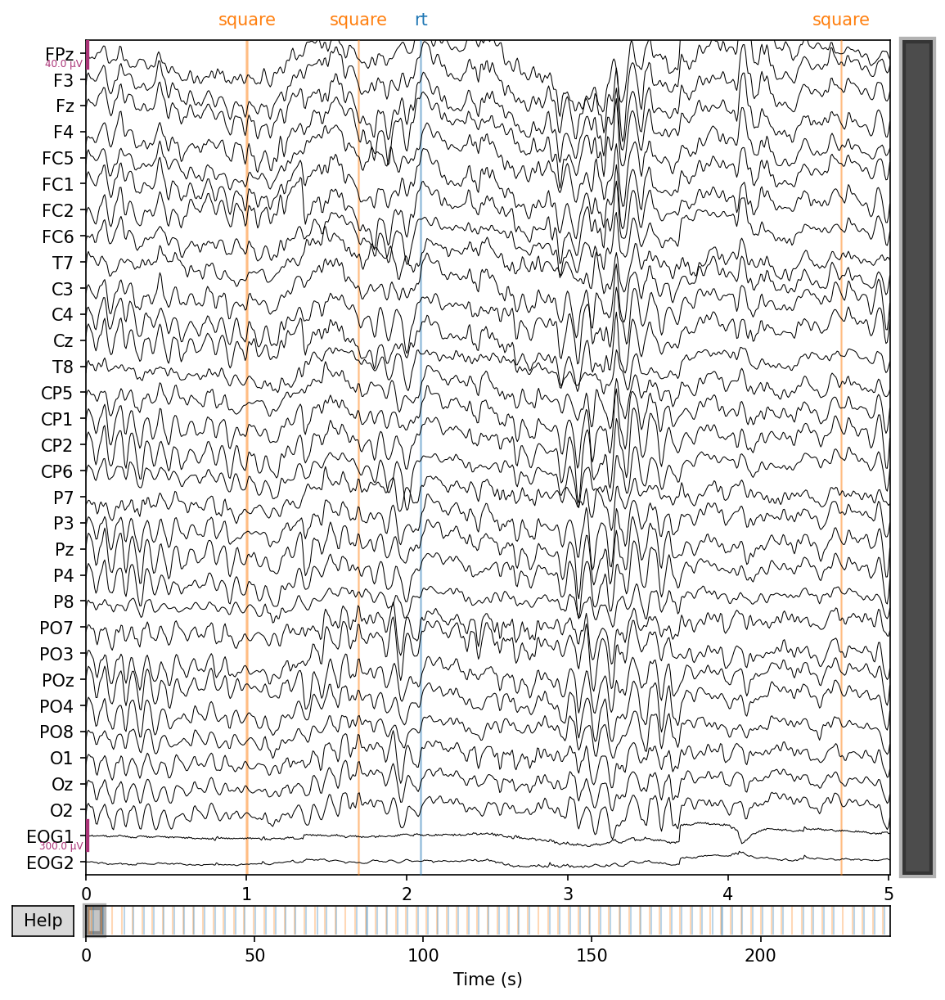

In [222]:
raw.plot(duration=5, n_channels=32, clipping=None)

In [223]:
#Setting reference
#raw.set_eeg_reference(ref_channels='average')

#Step 5 Segmeneting Data into Epochs

####Extracting Event Information

In [224]:
print(raw.annotations)

<Annotations | 154 segments: rt (74), square (80)>


In [225]:
print(raw.annotations.duration)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [226]:
print(raw.annotations.description)

['square' 'square' 'rt' 'square' 'rt' 'square' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square'
 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square'
 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square'
 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'rt'
 'square' 'rt' 'square' 'rt' 'square' 'rt' 'square' 'square' 'rt' 'sq

In [227]:
print(raw.annotations.onset)

[  1.000068   1.695381   2.082407   4.703193   5.148224   7.711006
  10.718818  11.303858  13.726631  14.116658  16.734443  17.187474
  19.742256  20.199287  22.750068  23.136095  25.757881  26.124906
  28.765693  29.140719  31.773506  32.116529  34.781318  35.24635
  37.789131  38.254163  40.796943  41.229973  43.804756  44.30079
  46.812568  47.156592  49.820381  50.273412  52.828193  53.242222
  55.836006  56.211031  58.843818  59.237845  61.851631  62.183654
  64.859443  65.257471  67.867256  68.598306  70.875068  71.277096
  73.882881  74.323911  76.890693  79.898506  80.269531  82.906318
  83.312346  85.914131  86.313158  88.921943  89.280968  91.929756
  92.323783  94.937568  95.296593  97.945381  98.37141  100.953193
 101.363221 103.961006 104.332031 106.968818 107.343844 109.976631
 110.425662 112.984443 113.410472 115.992256 116.367281 119.000068
 119.359093 122.007881 122.409908 125.015693 125.441722 128.023506
 128.422533 131.031318 131.433346 134.039131 137.046943 137.4889

In [228]:
###Event information Data Type Conversion
events, event_id = mne.events_from_annotations(raw)

Used Annotations descriptions: ['rt', 'square']


In [229]:
print(events.shape, event_id)

(154, 3) {'rt': 1, 'square': 2}


'rt' marker corresponds to the number 1, 'square' marker corresponds to the number 2.
There are 154 markers in total.

# prompt: in event shape what does 3 tell - (154, 3)

The `(154, 3)` shape indicates that the `events` array contains 154 events.  Each event is represented by a row with 3 columns:

1. **Sample number:**  The time point (in samples) where the event occurred.
2. **Event ID:** A numerical code that represents the type of event.  In your example, `rt` corresponds to 1 and `square` to 2.
3. **Unused:** This column is usually unused.


So, the `3` represents the number of columns in the events array, describing each event's sample number, ID, and an unused value.


##segment Data
- Data segmentation is based on Events.
Here, we extract the data from 1 second before the stimullus to 2 seconds after the stimulus, i.e. the data from -1s to 2s with the 'square' marker.
Take the baseline time interval from 0.5s before the stimulus to the onset of the stimulus. And set a threshold to exclude epochs i.e., the epoch that the difference between the largest and smallest values in it is greater than 2×10^-4 then will be excluded.
Note: The threshold value we use here is pretty large. Generally we recommend you to set the threshold between 5×10^-5 and 1×10^4 for good data quality.

In [230]:
epochs = mne.Epochs(raw, events, event_id=2, tmin=-1, tmax=2, baseline=(-0.5, 0),
                    preload=True, reject=dict(eeg=2e-4))

Not setting metadata
80 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 80 events and 385 original time points ...
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz', 'F3']
    Rejecting  epoch based on EEG : ['FPz', 'F3', 'Fz', 'F4']
    Rejecting  epoch based on EEG : ['FPz', 'F3']
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz', 'F3', 'Fz']
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz']
    Rejecting  epoch based on EEG : ['FPz', 'F3', 'Fz', 'F4']
    Rejecting  epoch based on EEG : ['FPz']
14 bad epochs dropped


In [231]:
print(epochs)

<Epochs | 66 events (all good), -1 – 2 s (baseline -0.5 – 0 s), ~6.3 MiB, data loaded,
 '2': 66>


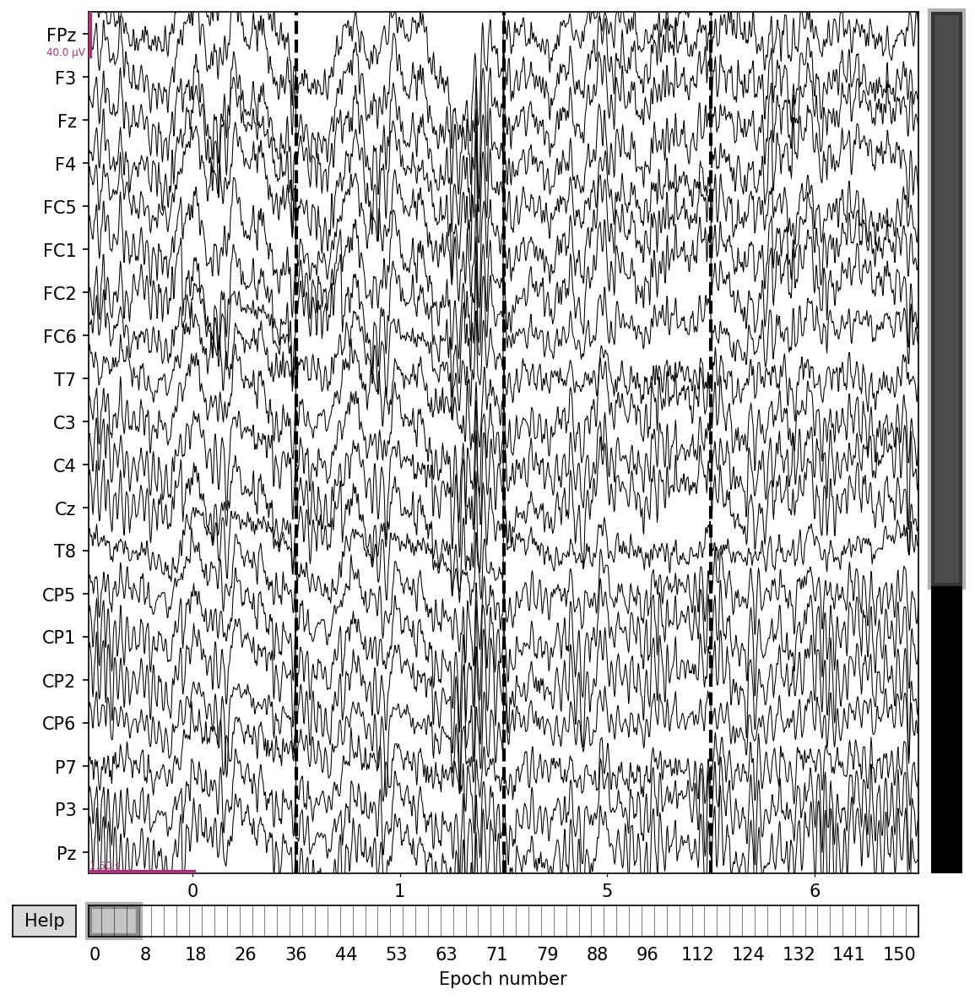

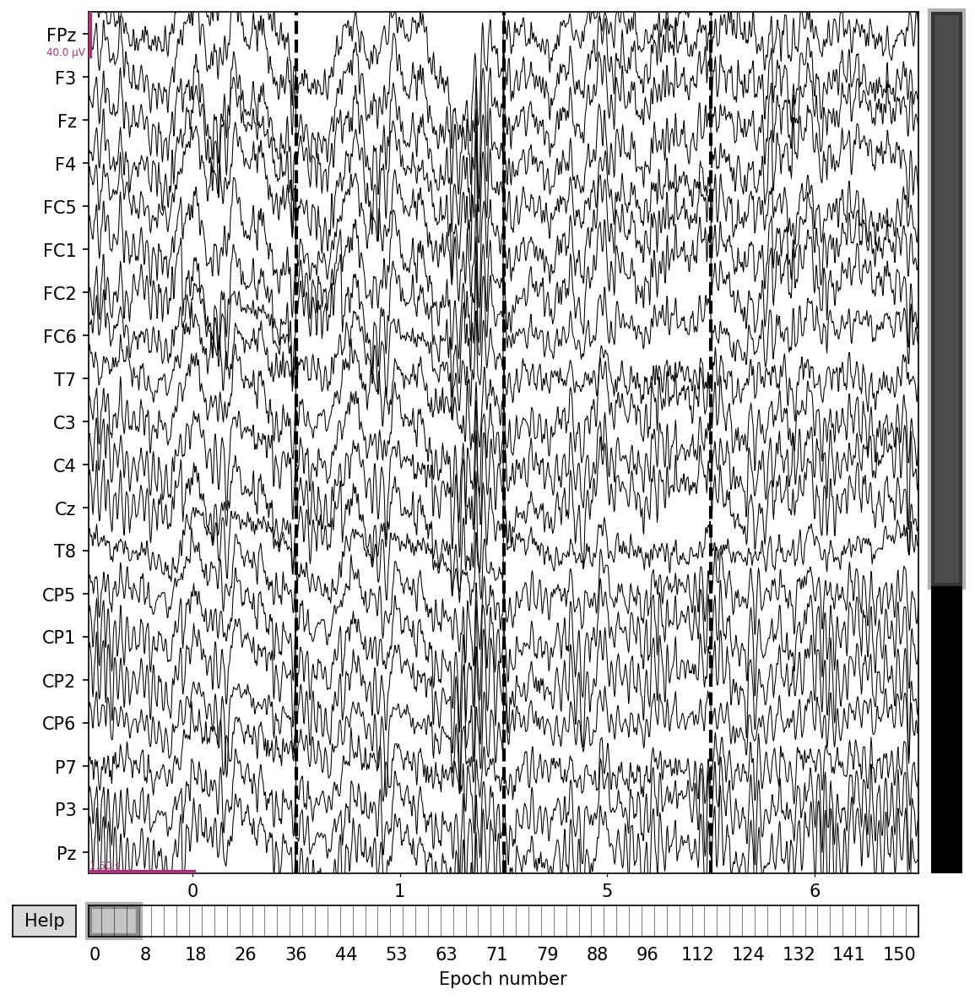

In [232]:
epochs.plot(n_epochs=4)

    Using multitaper spectrum estimation with 7 DPSS windows
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


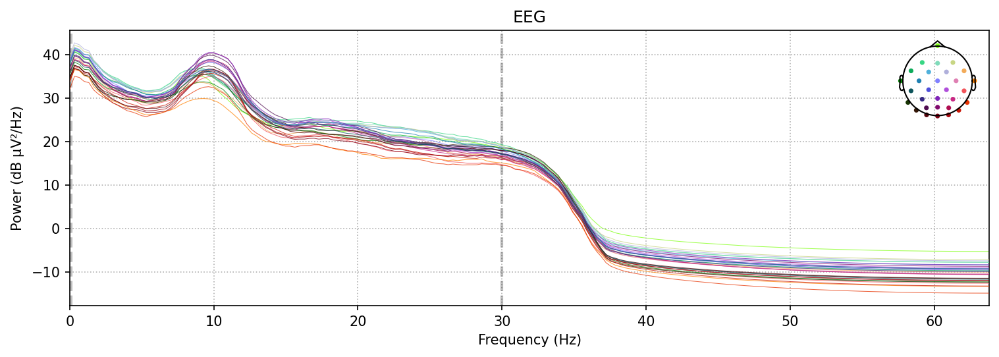

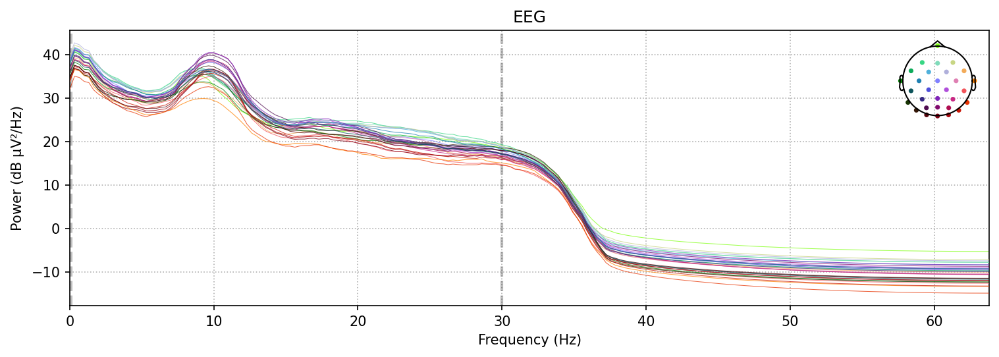

In [233]:
epochs.compute_psd().plot(picks='eeg')

###Plot the power spectrum topology (of Theta, Alpha and Beta bands):

NOTE: plot_psd_topomap() is a legacy function. New code should use .compute_psd().plot_topomap().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs before plotting...
converting legacy list-of-tuples input to a dict for the `bands` parameter


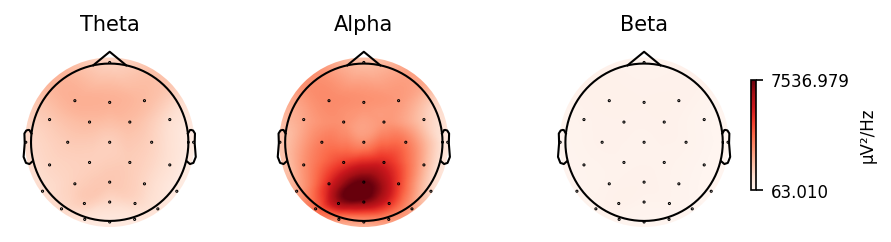

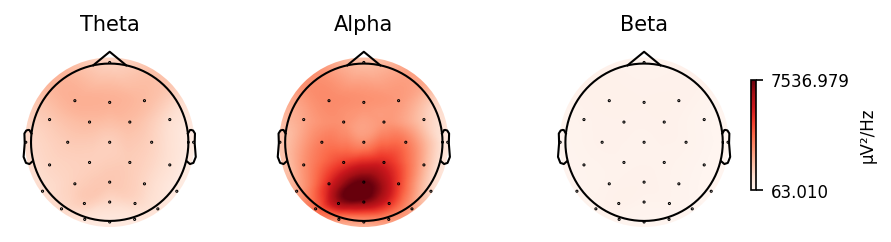

In [234]:
bands = [(4, 8, 'Theta'), (8, 12, 'Alpha'), (12, 30, 'Beta')]
epochs.plot_psd_topomap(bands=bands, vlim='joint')

#step 6 Data Averaging

MNE uses the Epochs Class to store segmented data and the Evoked Class to store evoked (after averaging) data

###Average Data

In [235]:
evoked = epochs.average()

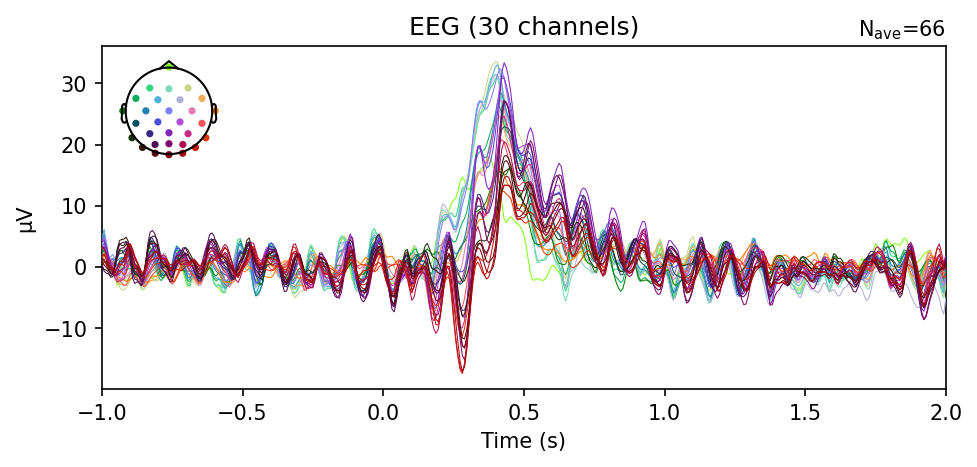

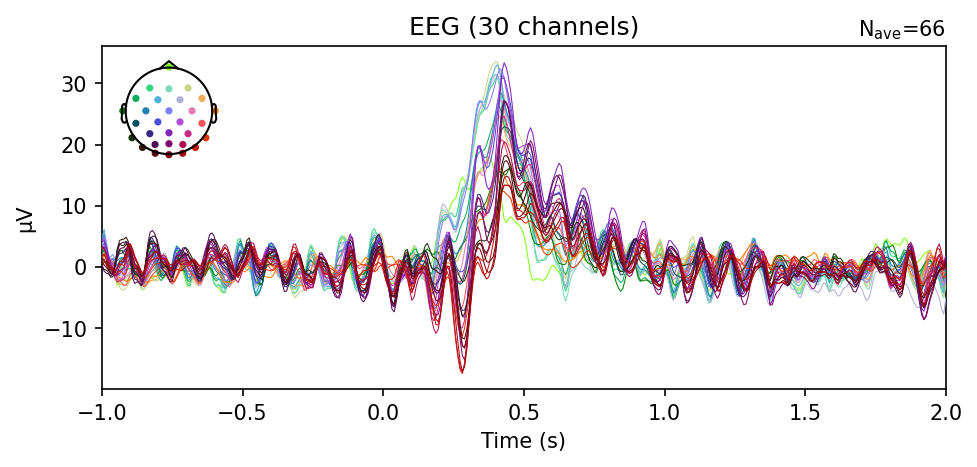

In [236]:
evoked.plot()

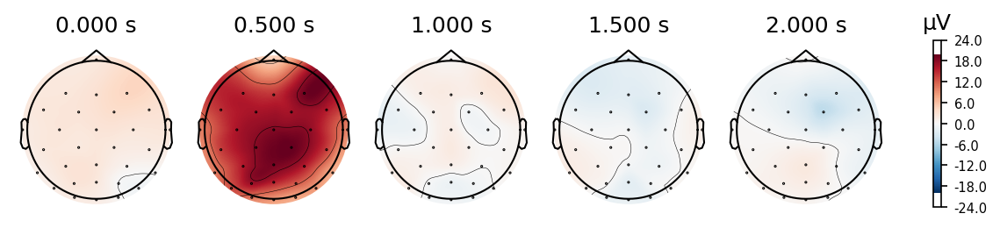

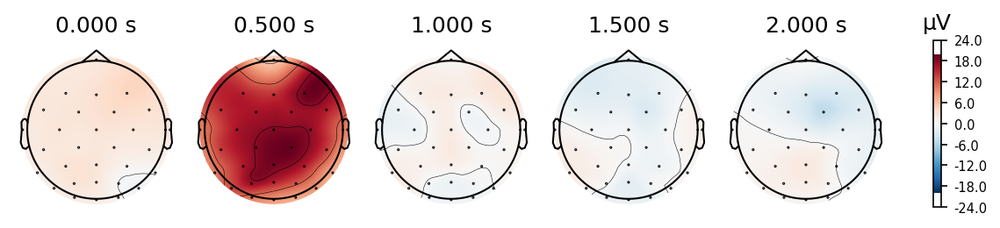

In [237]:
# Plot the topographic map at 0ms、0.5s、1s、1.5s and 2s
times = np.linspace(0, 2, 5)
evoked.plot_topomap(times=times, colorbar=True)

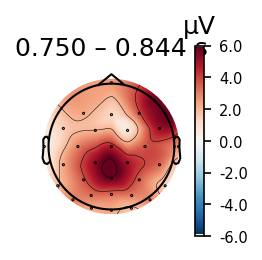

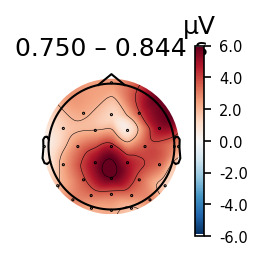

In [238]:
# Plot the topographic map at a particular time-point
# In this example, we plot the figure at 0.8s
# where we take the mean value from 0.75 to 0.85s

evoked.plot_topomap(times=0.8, average=0.1)

Plot evoked data as butterfly plot and add topomaps

No projector specified for this dataset. Please consider the method self.add_proj.


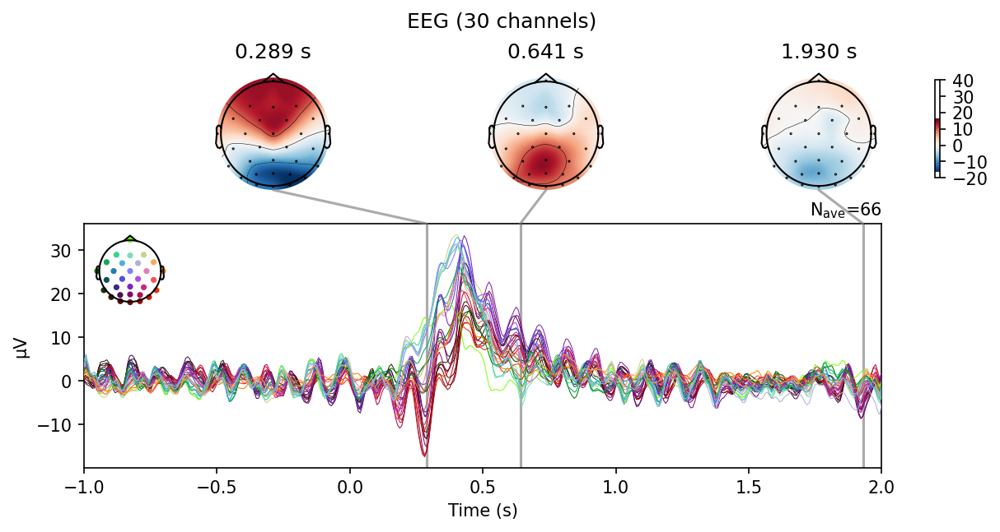

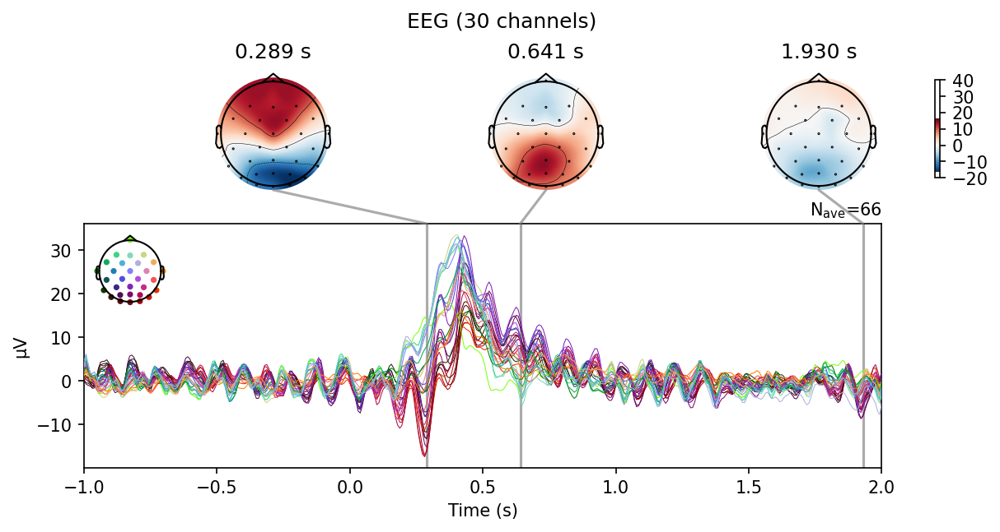

In [239]:
evoked.plot_joint()

Plotting channel-wise hotmaps

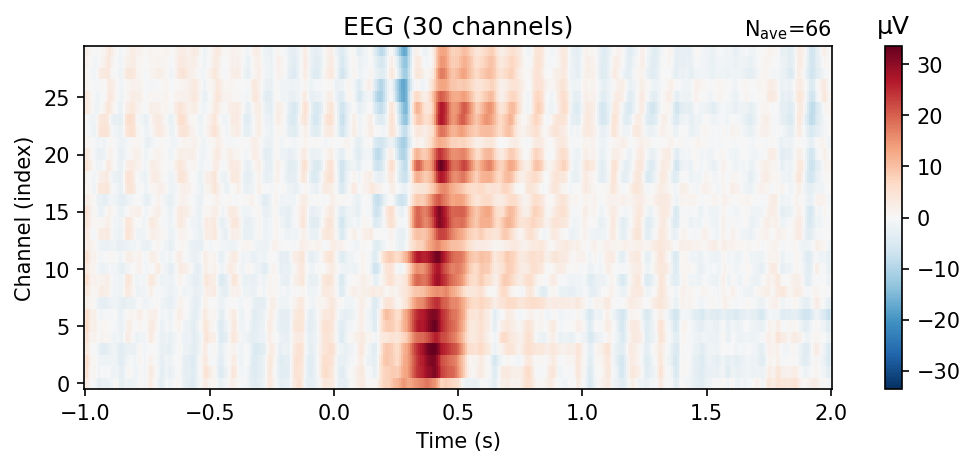

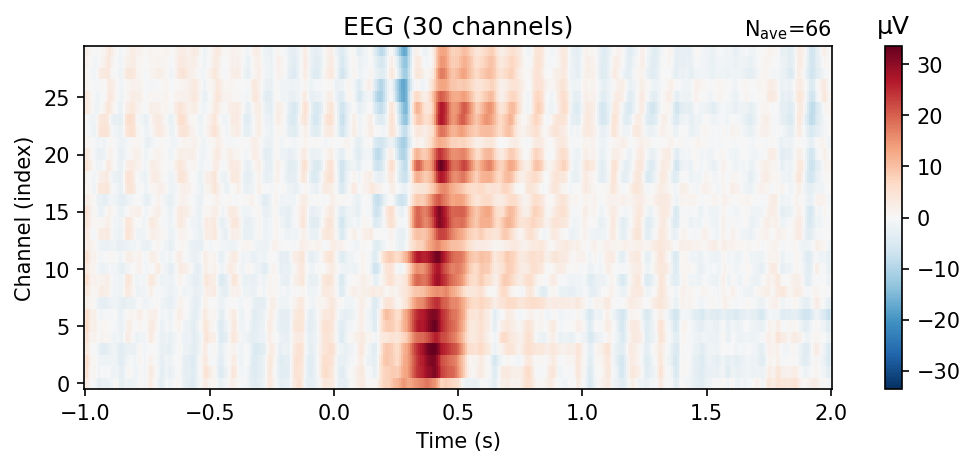

In [240]:
evoked.plot_image()

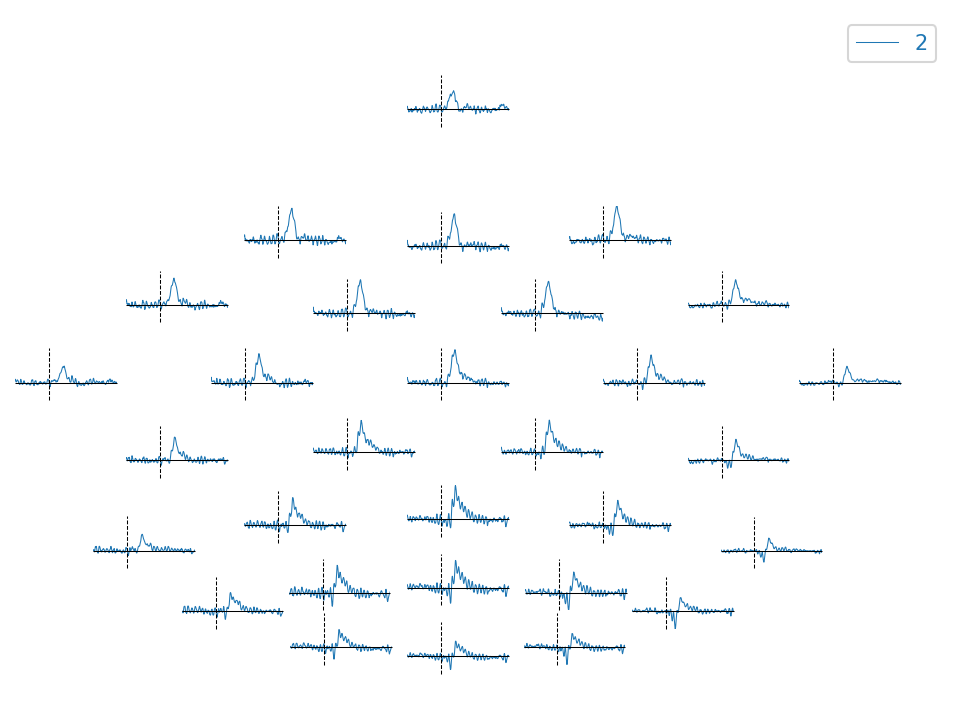

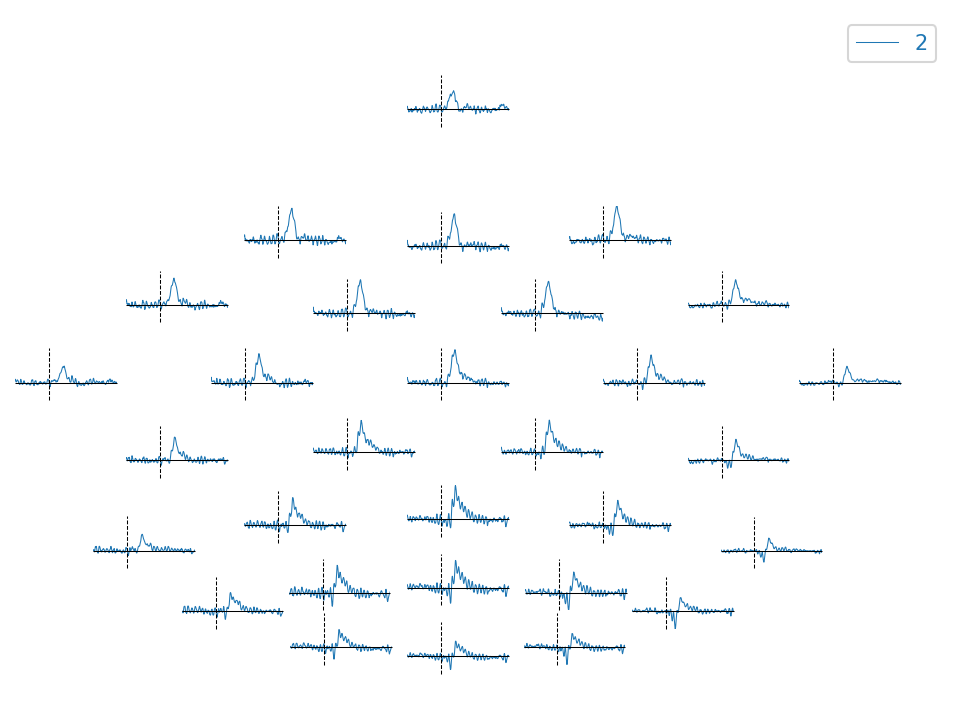

In [241]:
evoked.plot_topo()

Plot the averaged ERP of all channels

combining channels using "mean"


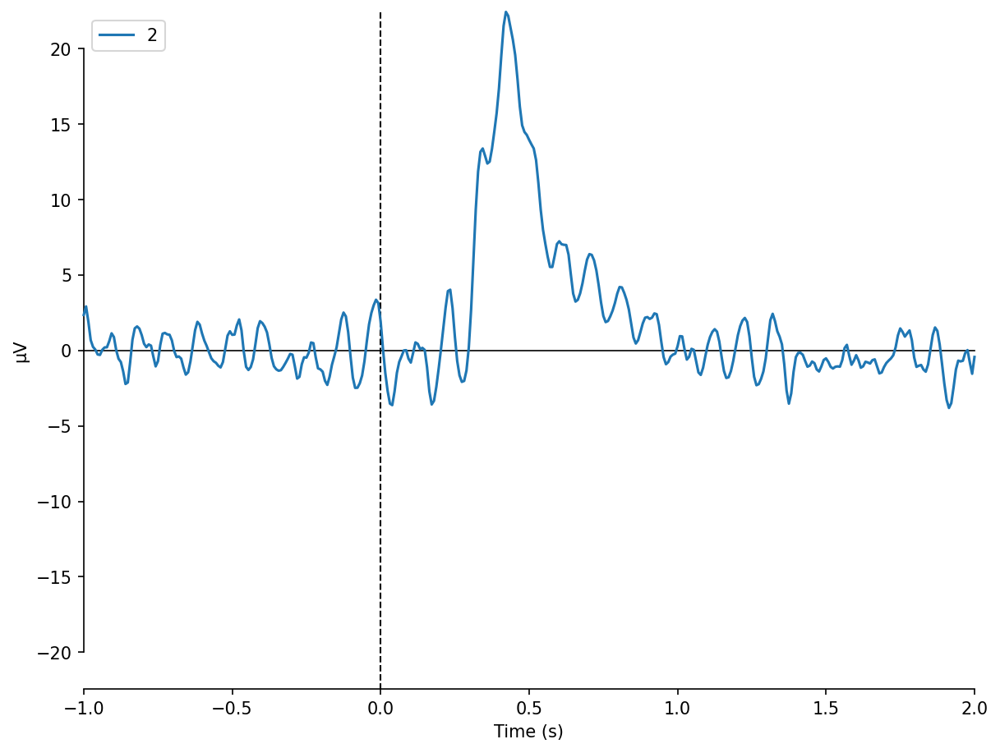

[<Figure size 1200x900 with 1 Axes>]

In [242]:
mne.viz.plot_compare_evokeds(evokeds=evoked, combine='mean')

combining channels using "mean"


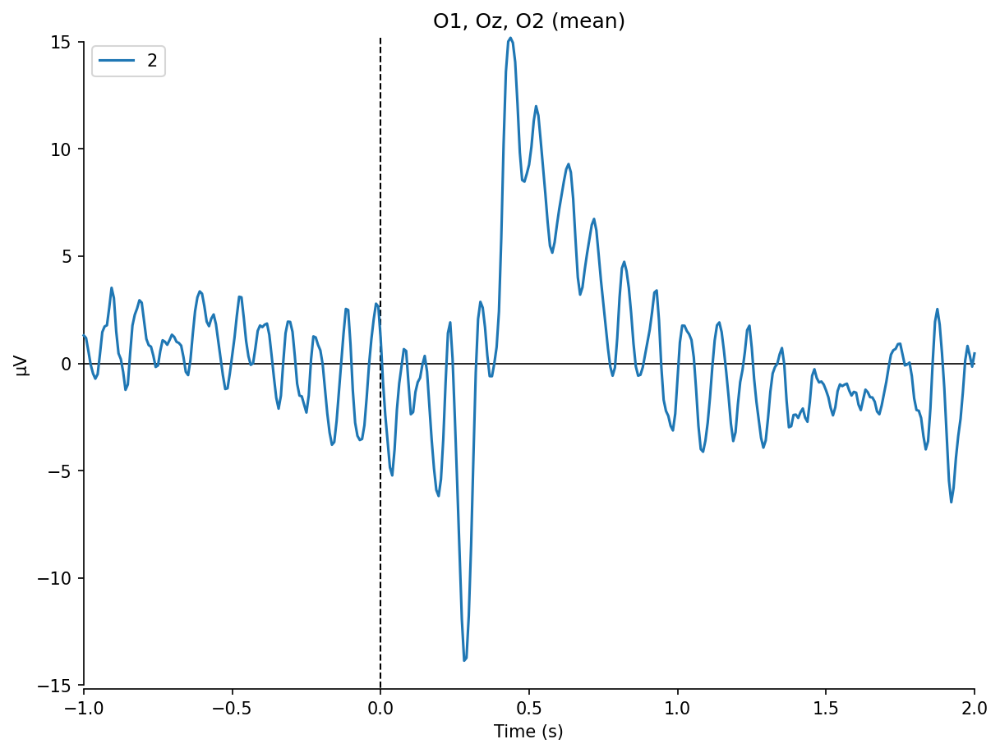

[<Figure size 1200x900 with 1 Axes>]

In [243]:
mne.viz.plot_compare_evokeds(evokeds=evoked, picks=['O1', 'Oz', 'O2'], combine='mean')

### Step 7 Time-Frequency Analysis

MNE provides three methods for time-frequency analysis, which are

Morlet wavelets, corresponding to mne.time_frequency.tfr_morlet()
DPSS tapers, corresponding to mne.time_frequency.tfr_multitaper()
Stockwell Transform, corresponding to mne.time_frequency.tfr_stockwell()

##Calculate power and inter-trial coherence (ITC)

In [244]:
#Set some parameters for time frequency analysis
#The frequency band is selected from 4 to 30 hz

freqs = np.logspace(*np.log10([4, 30]), num=10)
n_cycles = freqs / 2.
power, itc = tfr_morlet(epochs, freqs=freqs, n_cycles=n_cycles, use_fft=True)

NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Plot power result of occipital channels

Applying baseline correction (mode: logratio)


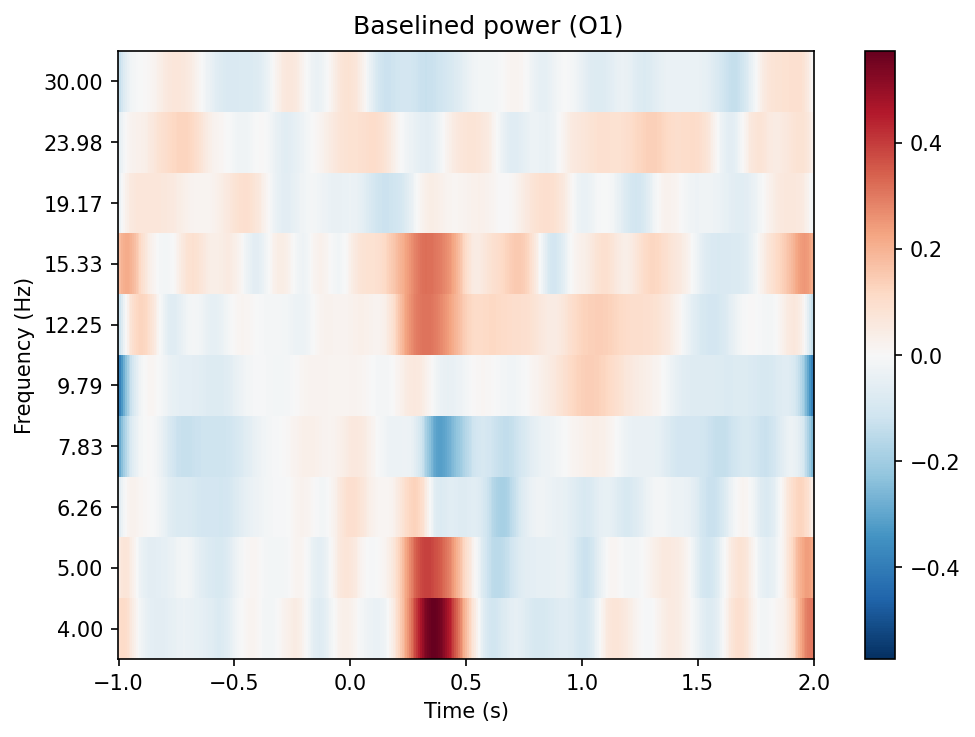

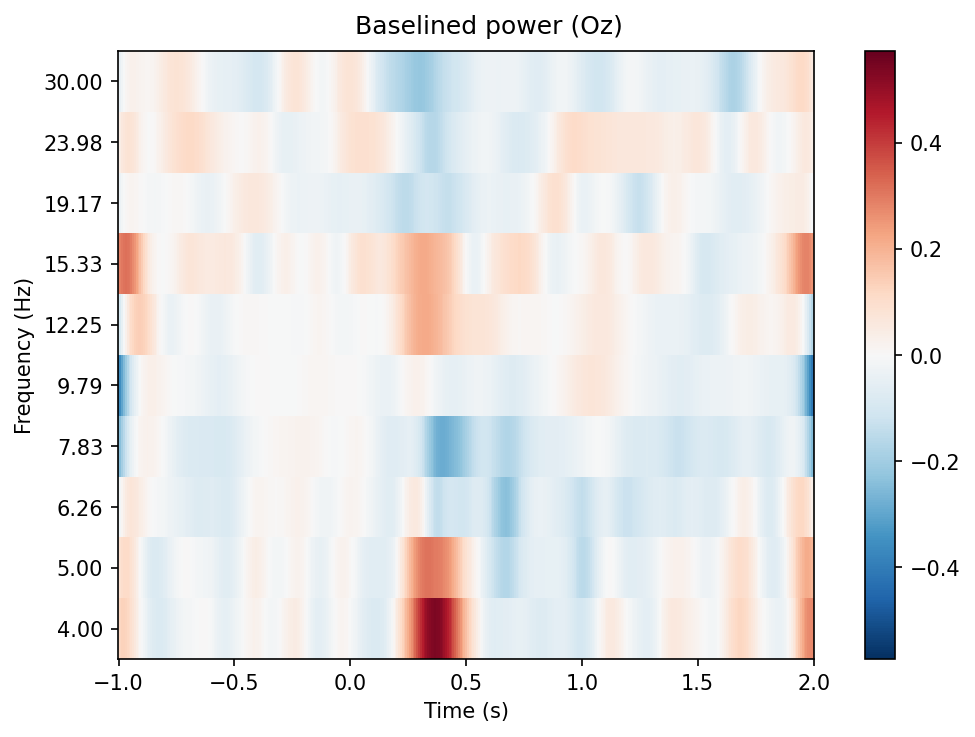

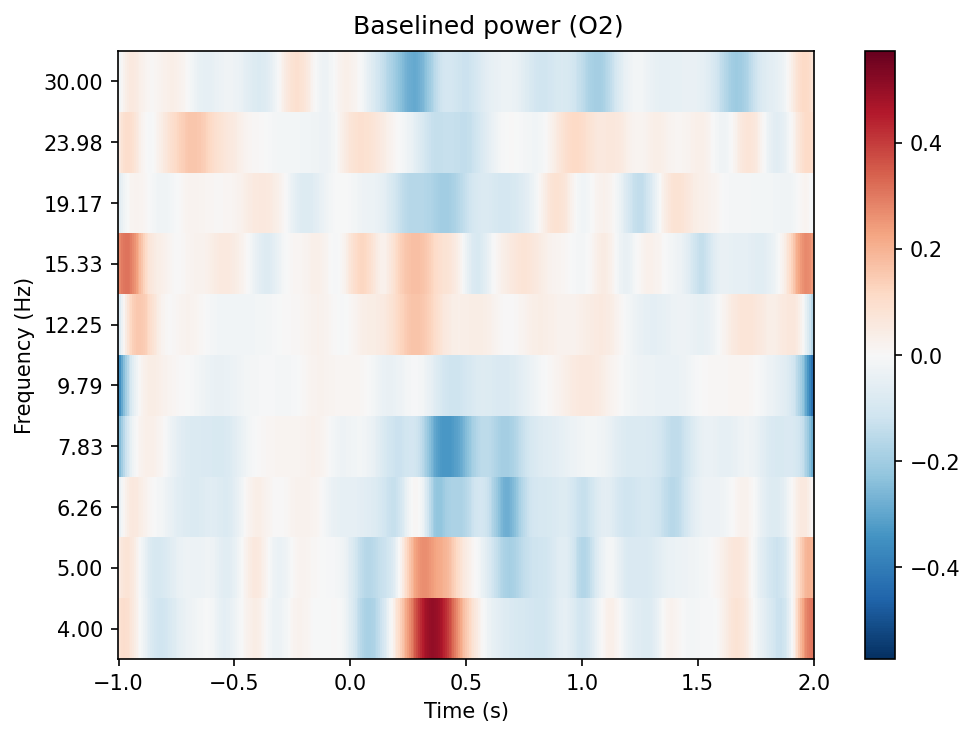

[<Figure size 960x720 with 2 Axes>,
 <Figure size 960x720 with 2 Axes>,
 <Figure size 960x720 with 2 Axes>]

In [245]:
power.plot(picks=['O1', 'Oz', 'O2'], baseline=(-0.5, 0), mode='logratio', title='auto')

Plot mean power result of occipital channels

Applying baseline correction (mode: logratio)


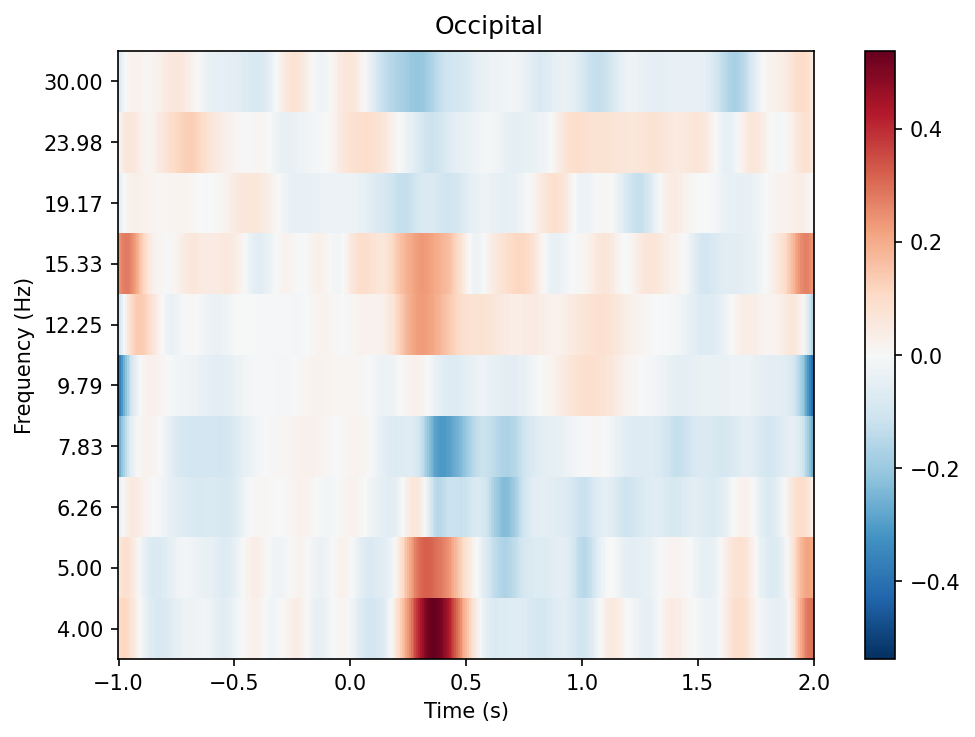

[<Figure size 960x720 with 2 Axes>]

In [246]:
power.plot(picks=['O1', 'Oz', 'O2'], baseline=(-0.5, 0), mode='logratio',
           title='Occipital', combine='mean')

##Plot 2D power topology

Applying baseline correction (mode: logratio)


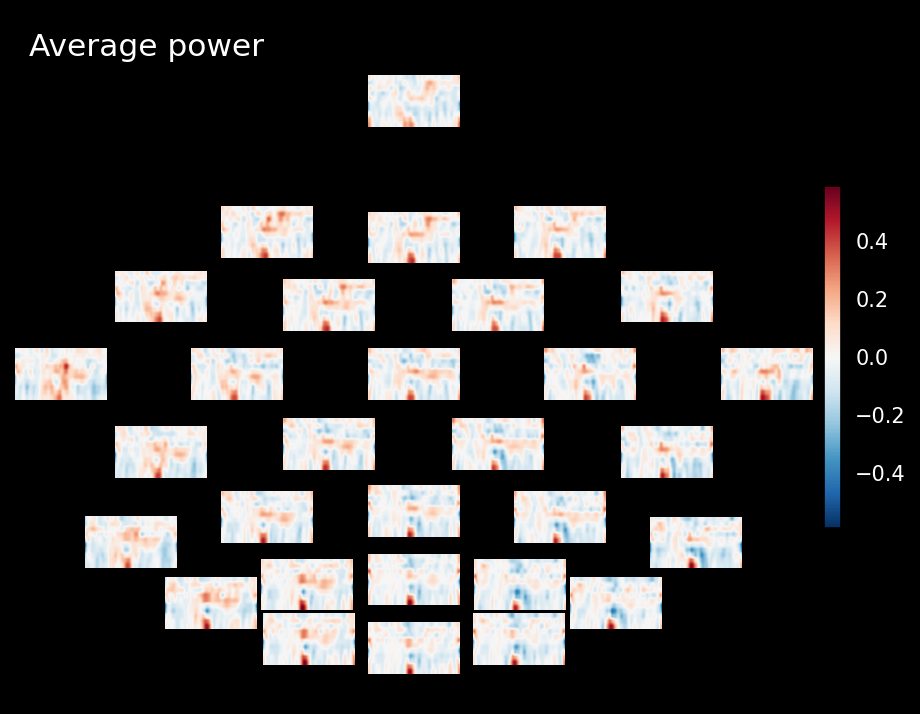

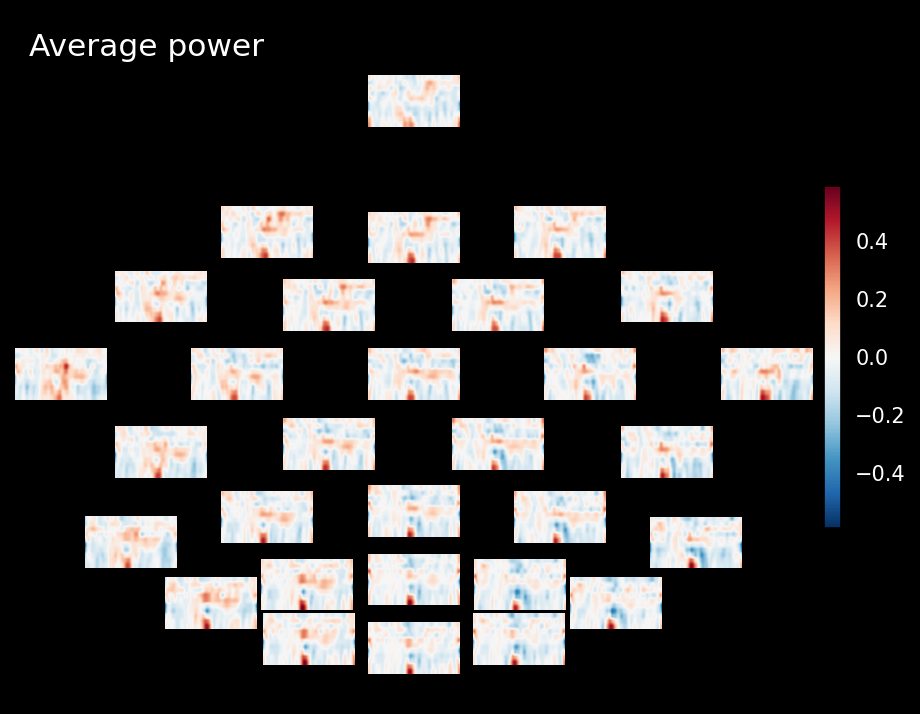

In [247]:
power.plot_topo(baseline=(-0.5, 0), mode='logratio', title='Average power')

Plot power topology for different frequencies

Applying baseline correction (mode: logratio)


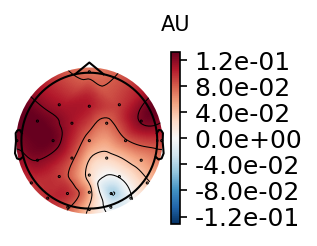

Applying baseline correction (mode: logratio)


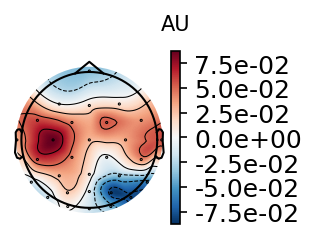

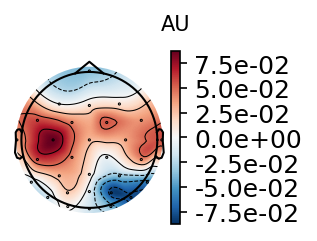

In [248]:
# Take theta power and alpha powers as an example
# Take the result of 0-0.5s

power.plot_topomap(tmin=0, tmax=0.5, fmin=4, fmax=8,
                   baseline=(-0.5, 0), mode='logratio')
power.plot_topomap(tmin=0, tmax=0.5, fmin=8, fmax=12,
                   baseline=(-0.5, 0), mode='logratio')

##Plot joint figures

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


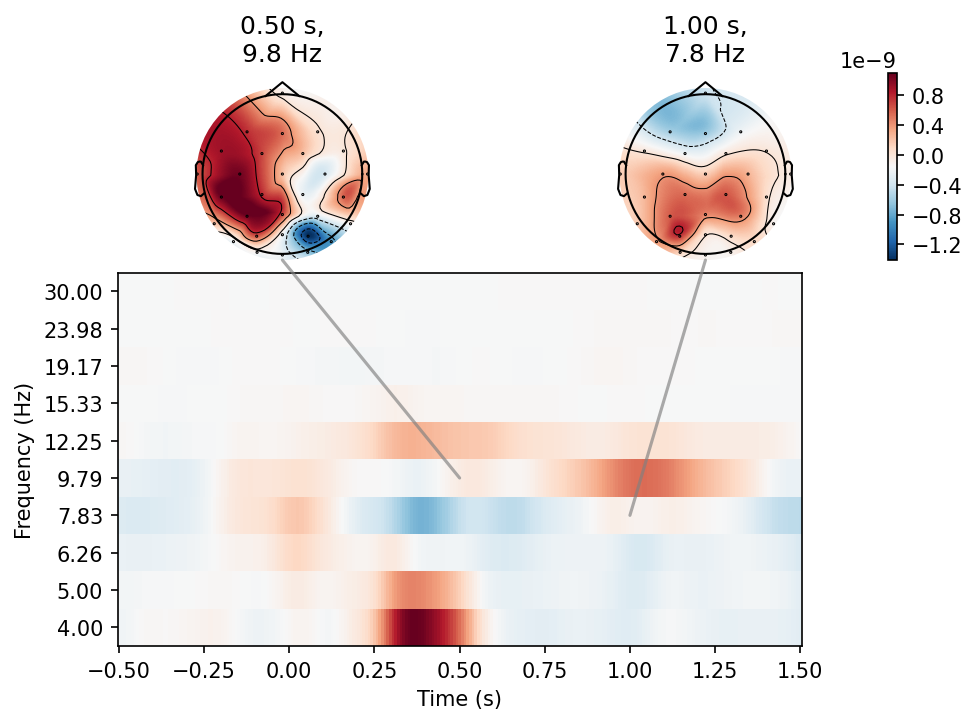

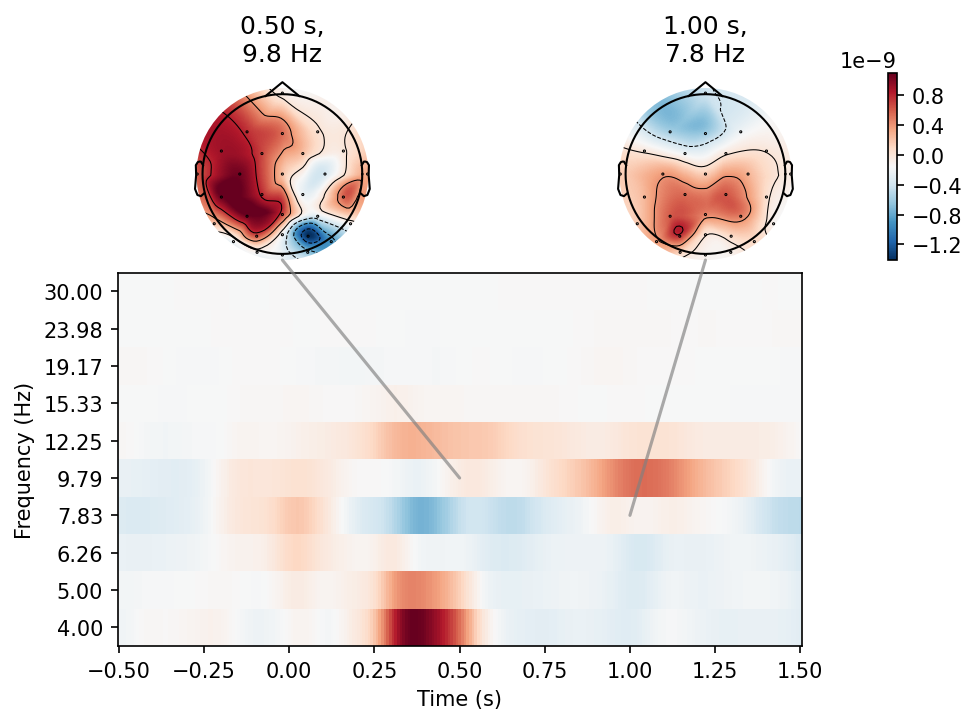

In [249]:
# And plot the results around 10Hz at 0.5s and around 8Hz at 1s
power.plot_joint(baseline=(-0.5, 0), mode='mean', tmin=-0.5, tmax=1.5,
                 timefreqs=[(0.5, 10), (1, 8)])

ITC results are plotted in similar ways. Below is an example of plotting ITC topology.

Applying baseline correction (mode: logratio)


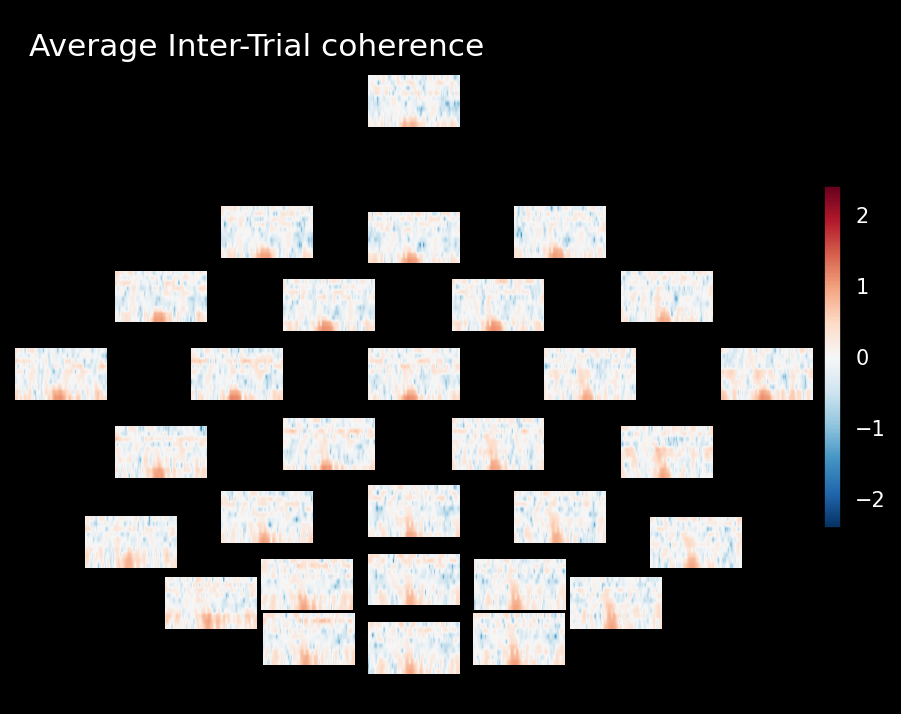

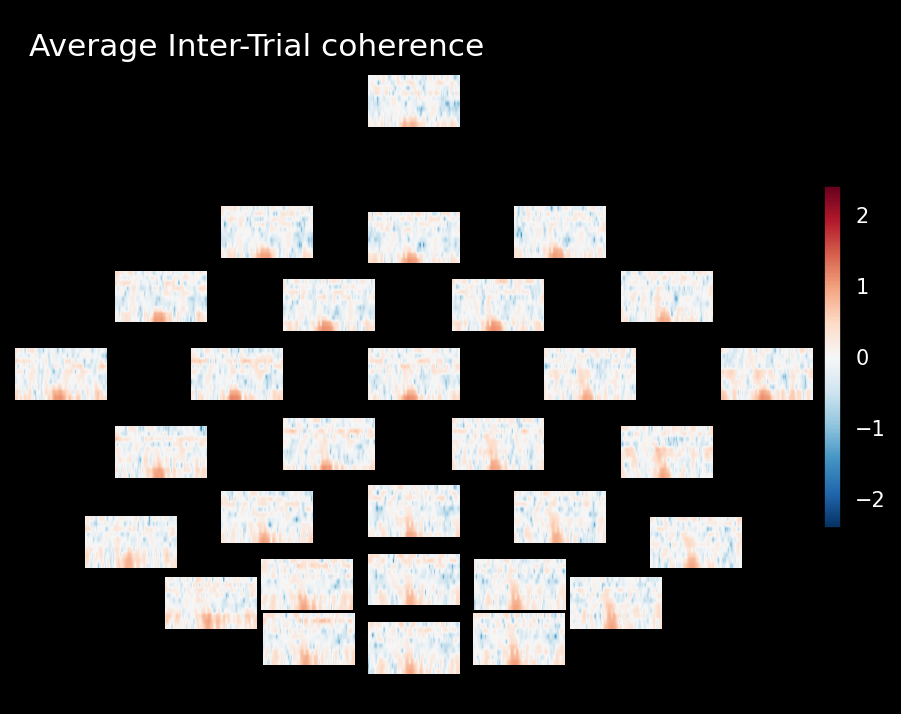

In [250]:
itc.plot_topo(baseline=(-0.5, 0), mode='logratio', title='Average Inter-Trial coherence')

##Step 8 Data Extraction

##Use "get_data()"

In [251]:
epochs_array = epochs.get_data()

In [252]:
print(epochs_array.shape)
print(epochs_array)

(66, 32, 385)
[[[ 1.84900873e-05  2.94888041e-05  3.09526889e-05 ... -2.66165717e-05
   -2.49305101e-05 -2.36806466e-05]
  [ 1.90724252e-05  3.49982830e-05  1.52169891e-05 ... -6.16457047e-05
   -6.91169876e-05 -4.49072670e-05]
  [ 2.41159049e-05  3.92011667e-05  4.24861851e-05 ... -4.84971466e-06
    2.76701907e-06  6.02331769e-06]
  ...
  [ 8.63134513e-07  1.11562405e-05  1.56770648e-05 ...  1.27370151e-05
    1.31825302e-05  1.55665295e-05]
  [-6.62004616e-07  1.06648262e-05  1.45374372e-05 ...  2.31476605e-06
    3.76675843e-06  1.08354922e-05]
  [ 1.78017103e-06  1.54090452e-05  1.87189818e-05 ... -4.51864957e-06
   -2.07795108e-06  9.59600716e-06]]

 [[-3.93803415e-05 -4.42231240e-05 -5.03853144e-05 ... -2.92213530e-05
   -2.96102424e-05 -1.21684823e-05]
  [-1.98700747e-05 -2.32499213e-05 -2.34376177e-05 ... -5.87000498e-05
   -6.47002100e-05 -5.75247492e-05]
  [-4.97212397e-05 -4.88277508e-05 -5.23291353e-05 ... -2.40215895e-05
   -2.43049496e-05 -9.50862698e-06]
  ...
  [-1.321

f you want to obtain EEG data (exclude EOG or other channels' data), the above code can be modified to:

epochs_array = epochs.get_data(picks=['eeg'])

##Use ".data"

In [253]:
power_array = power.data

In [254]:
print(power_array.shape)
print(power_array)

(30, 10, 385)
[[[2.11730774e-09 2.16522780e-09 2.18313430e-09 ... 2.56854625e-09
   2.61118095e-09 2.60787377e-09]
  [1.64796412e-09 1.71771683e-09 1.76511780e-09 ... 1.87355357e-09
   1.87610852e-09 1.84638030e-09]
  [1.36288728e-09 1.45323711e-09 1.52913914e-09 ... 1.54355612e-09
   1.49631584e-09 1.43016115e-09]
  ...
  [1.70349911e-10 1.80942930e-10 1.90091496e-10 ... 1.44284850e-10
   1.40343491e-10 1.35098679e-10]
  [8.19170722e-11 8.50814130e-11 8.74329111e-11 ... 1.36842932e-10
   1.31546336e-10 1.25016524e-10]
  [8.13324057e-11 8.55201726e-11 8.87934512e-11 ... 9.97839950e-11
   9.72472544e-11 9.35328174e-11]]

 [[2.28709903e-09 2.38457373e-09 2.46084504e-09 ... 2.89418450e-09
   2.92615911e-09 2.91364090e-09]
  [1.86518436e-09 1.98030055e-09 2.07944455e-09 ... 2.16945177e-09
   2.16398951e-09 2.12615538e-09]
  [1.65131173e-09 1.78765870e-09 1.91363849e-09 ... 1.97387081e-09
   1.90078797e-09 1.80746523e-09]
  ...
  [2.34340851e-10 2.49733476e-10 2.63214231e-10 ... 1.86341584e